In [1]:
%load_ext autoreload
%autoreload 2
import sys

# instead of creating a package using setup.py or building from a docker/singularity file,
# import the sister directory of src code to be called on in notebook.
# This keeps the notebook free from code to only hold visualizations and is easier to test
# It also helps keep the state of variables clean such that cells aren't run out of order with a mysterious state
sys.path.append("..")

In [2]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.cluster import KMeans

# import sklearn.cluster.hierarchical as hclust
from sklearn import preprocessing
import seaborn as sns
from sklearn.metrics import silhouette_score

from src import most_recent_mesonet_data
from src import most_recent_mesonet_time
from src import landtype_describe
from src.plotting_scripts import landtype
import os
import pandas as pd
import cartopy.crs as crs
import cartopy.feature as cfeature

Matplotlib created a temporary config/cache directory at /tmp/tmp.OXjCkrdHZ6/matplotlib-htk1n5zd because the default path (/home/aevans/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [3]:
def plurality_plot(df):
    projPC = crs.PlateCarree()
    latN = df["lat"].max() + 1
    latS = df["lat"].min() - 1
    lonW = df["lon"].max() + 1
    lonE = df["lon"].min() - 1
    cLat = (latN + latS) / 2
    cLon = (lonW + lonE) / 2
    projLcc = crs.LambertConformal(central_longitude=cLon, central_latitude=cLat)

    fig, ax = plt.subplots(
        figsize=(12, 9), subplot_kw={"projection": crs.PlateCarree()}, dpi=400
    )
    ax.set_extent([lonW, lonE, latS, latN], crs=projPC)
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle="--")
    ax.add_feature(cfeature.LAKES, alpha=0.5)
    ax.add_feature(cfeature.STATES)
    ax.xticklabels_top = False
    ax.ylabels_right = False
    ax.gridlines(
        crs=crs.PlateCarree(),
        draw_labels=True,
        linewidth=2,
        color="black",
        alpha=0.5,
        linestyle="--",
    )
    ax.scatter(
        x=df["lon"],
        y=df["lat"],
        c=df["color"],
        s=40,
        marker="o",
        edgecolor="black",
        transform=crs.PlateCarree(),
    )
    ax.set_title("Mesonet Site Groups", size=16)
    ax.set_xlabel("Longitude", size=14)
    ax.set_ylabel("Latitude", size=14)
    ax.tick_params(axis="x", labelsize=12)
    ax.tick_params(axis="y", labelsize=12)
    ax.grid()

In [4]:
def plurality_plot_x(df):
    projPC = crs.PlateCarree()
    latN = df["lat_x"].max() + 1
    latS = df["lat_x"].min() - 1
    lonW = df["lon_x"].max() + 1
    lonE = df["lon_x"].min() - 1
    cLat = (latN + latS) / 2
    cLon = (lonW + lonE) / 2
    projLcc = crs.LambertConformal(central_longitude=cLon, central_latitude=cLat)

    fig, ax = plt.subplots(
        figsize=(12, 9), subplot_kw={"projection": crs.PlateCarree()}, dpi=400
    )
    ax.set_extent([lonW, lonE, latS, latN], crs=projPC)
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle="--")
    ax.add_feature(cfeature.LAKES, alpha=0.5)
    ax.add_feature(cfeature.STATES)
    ax.xticklabels_top = False
    ax.ylabels_right = False
    ax.gridlines(
        crs=crs.PlateCarree(),
        draw_labels=True,
        linewidth=2,
        color="black",
        alpha=0.5,
        linestyle="--",
    )
    ax.scatter(
        x=df["lon_x"],
        y=df["lat_x"],
        c=df["color"],
        s=40,
        marker="o",
        edgecolor="black",
        transform=crs.PlateCarree(),
    )
    ax.set_title("Mesonet Site Groups", size=16)
    ax.set_xlabel("Longitude", size=14)
    ax.set_ylabel("Latitude", size=14)
    ax.tick_params(axis="x", labelsize=12)
    ax.tick_params(axis="y", labelsize=12)
    ax.grid()

In [5]:
# get lons and lats
# This will return the most recent data avail on mesonet
# this is my file path
ny_mesonet_data_path = "/home/aevans/nysm/archive/nysm/netcdf/proc/"
ok_mesonet_data_path = "/home/aevans/landtype/geoinfo.csv"

In [6]:
# create a dataframe of mesonet data ny
ny_df = most_recent_mesonet_data.current_time_mesonet_df(ny_mesonet_data_path)
ny_df = most_recent_mesonet_time.most_recent_time(ny_df, ny_mesonet_data_path)

In [7]:
ny_df_lons = ny_df["lon"].to_list()
ny_df_lats = ny_df["lat"].to_list()

In [8]:
df_lulc = pd.read_csv("/home/aevans/landtype/data/buffer_10_percent.csv")
df_lulc.head()

,site,11,21,22,23,24,31,41,42,43,52,71,81,82,90,95,station
0,1,1.962930,5.647257,1.299929,0.483068,0.109736,0.137242,29.370894,3.830164,25.780258,0.441523,0.210304,25.685135,4.069406,0.417742,0.554411,ADDI
1,2,1.820203,4.007140,0.595656,0.093976,0.009168,0.090537,66.349595,2.819553,11.070490,0.875577,0.462428,10.919786,0.054151,0.728310,0.103430,ANDE
2,3,0.697071,5.277453,4.213367,2.021878,0.932866,0.281350,7.929932,0.161303,1.428809,0.209436,0.164168,9.390256,53.911103,12.363336,1.017672,BATA
3,4,10.653124,11.111843,10.012464,9.876366,3.972609,0.532928,42.712777,0.089967,0.535507,0.405427,0.511153,4.466284,0.080799,4.492357,0.546395,BEAC
4,5,0.649265,4.491848,1.082204,0.356723,0.039254,0.121773,28.382281,6.408126,31.918283,0.320048,0.181657,22.293917,1.908828,1.531475,0.314318,BELD


In [9]:
# exclude the categorical columns
features = df_lulc.drop(["site", "station"], axis=1)

In [10]:
features.describe()

,11,21,22,23,24,31,41,42,43,52,71,81,82,90,95
count,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000
mean,6.617224,5.093585,3.297740,2.607357,2.021645,0.207434,32.025156,6.830576,9.873951,0.694704,0.606327,13.464174,8.093126,7.684473,0.882529
std,11.526810,3.677591,3.991497,5.531372,7.598882,0.276318,16.451054,8.521825,8.964980,0.565298,0.637150,9.703226,12.764721,5.990246,0.966943
min,0.039253,0.562736,0.036388,0.013753,0.000573,0.000000,0.384202,0.007449,0.014612,0.051857,0.054152,0.002865,0.000000,0.264157,0.047849
25%,0.711431,3.136340,1.099685,0.364960,0.067188,0.049829,19.670130,1.335821,2.551325,0.349902,0.271267,5.608782,0.202279,3.010169,0.390588
50%,1.605698,4.305988,2.092039,0.809985,0.167042,0.113744,32.543153,3.241939,7.811640,0.516432,0.446523,13.412459,2.745421,6.877554,0.615283
75%,5.843998,5.538619,3.819899,1.787487,0.564439,0.280926,42.825779,9.857389,13.802640,0.935231,0.719396,20.191105,8.637331,11.034116,1.146611
max,68.886431,23.291820,28.245067,33.463121,53.487473,1.841951,69.827976,43.880817,47.277676,3.716915,5.670260,42.595553,57.047361,33.070332,9.229526


In [11]:
# noramalize data
scaler = preprocessing.MinMaxScaler()
features_normal = scaler.fit_transform(features)

In [12]:
pd.DataFrame(features_normal).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
count,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000
mean,0.095545,0.199341,0.115615,0.077538,0.037786,0.112616,0.455634,0.155519,0.208606,0.175399,0.098320,0.316047,0.141867,0.226187,0.090907
std,0.167426,0.161801,0.141499,0.165366,0.142070,0.150014,0.236897,0.194237,0.189683,0.154240,0.113450,0.227814,0.223757,0.182595,0.105312
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.009763,0.113230,0.037694,0.010500,0.001245,0.027052,0.277720,0.030277,0.053672,0.081320,0.038659,0.131617,0.003546,0.083704,0.037329
50%,0.022752,0.164690,0.072873,0.023804,0.003112,0.061752,0.463093,0.073723,0.164971,0.126758,0.069865,0.314833,0.048125,0.201590,0.061801
75%,0.084313,0.218921,0.134126,0.053027,0.010542,0.152515,0.611165,0.224508,0.291729,0.241026,0.118453,0.473984,0.151406,0.328291,0.119669
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [13]:
# kmeans clustering
inertia = []
K = range(1, 20)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(features_normal)
    kmeanModel.fit(features_normal)
    inertia.append(kmeanModel.inertia_)

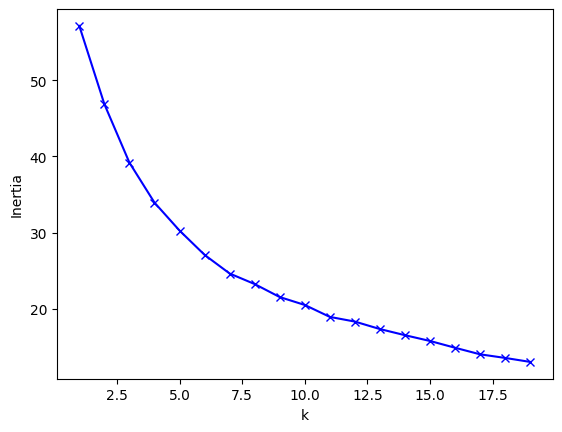

In [14]:
# Plot the elbow
plt.plot(K, inertia, "bx-")
plt.xlabel("k")
plt.ylabel("Inertia")
plt.show()

In [15]:
# let's say our elbow is 12
kmeans = KMeans(n_clusters=6).fit(features_normal)

In [16]:
labels = pd.DataFrame(
    kmeans.labels_
)  # This is where the label output of the KMeans we just ran lives. Make it a dataframe so we can concatenate back to the original data
labeledClasses = pd.concat((features, labels), axis=1)
labeledClasses = labeledClasses.rename({0: "labels"}, axis=1)

In [17]:
labeledClasses.head()

,11,21,22,23,24,31,41,42,43,52,71,81,82,90,95,labels
0,1.962930,5.647257,1.299929,0.483068,0.109736,0.137242,29.370894,3.830164,25.780258,0.441523,0.210304,25.685135,4.069406,0.417742,0.554411,0
1,1.820203,4.007140,0.595656,0.093976,0.009168,0.090537,66.349595,2.819553,11.070490,0.875577,0.462428,10.919786,0.054151,0.728310,0.103430,0
2,0.697071,5.277453,4.213367,2.021878,0.932866,0.281350,7.929932,0.161303,1.428809,0.209436,0.164168,9.390256,53.911103,12.363336,1.017672,1
3,10.653124,11.111843,10.012464,9.876366,3.972609,0.532928,42.712777,0.089967,0.535507,0.405427,0.511153,4.466284,0.080799,4.492357,0.546395,2
4,0.649265,4.491848,1.082204,0.356723,0.039254,0.121773,28.382281,6.408126,31.918283,0.320048,0.181657,22.293917,1.908828,1.531475,0.314318,0


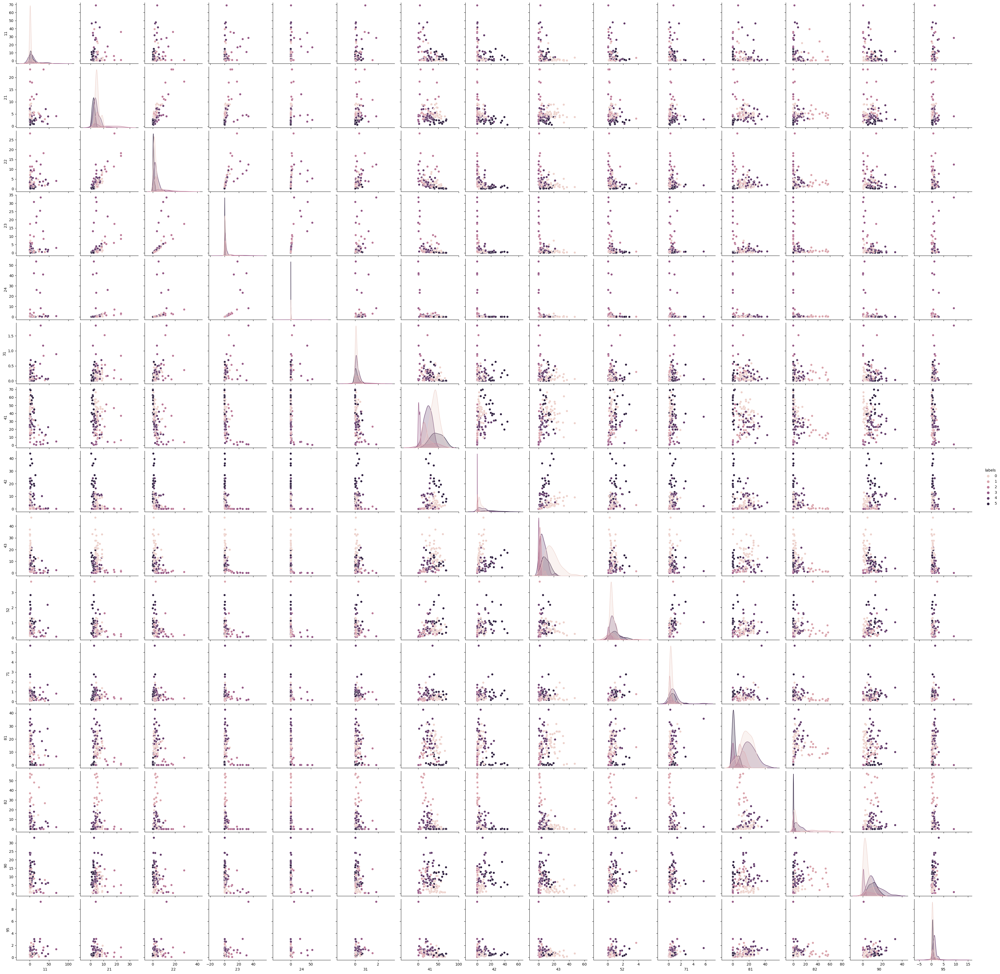

In [18]:
sns.pairplot(labeledClasses, hue="labels")

In [19]:
labeledClasses[
    "Constant"
] = "Data"  # This is just to add something constant for the strip/swarm plots' X axis. Can be anything you want it to be.

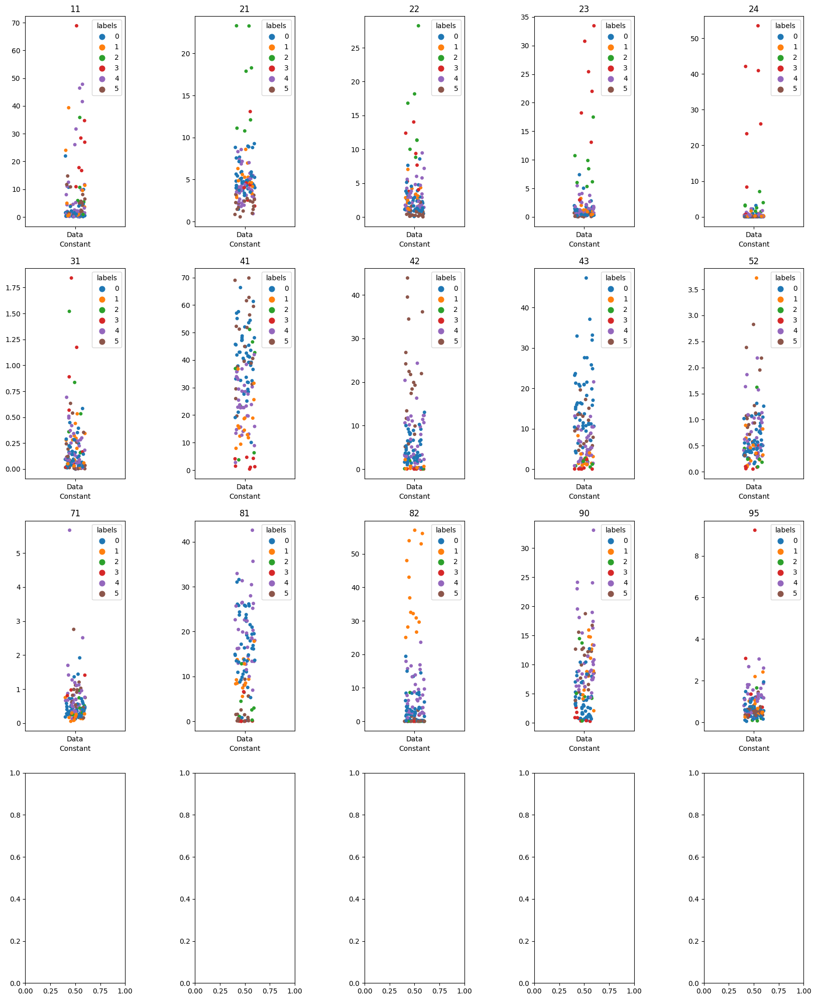

In [20]:
f, axes = plt.subplots(
    4, 5, figsize=(20, 25), sharex=False
)  # create a 4x5 grid of empty figures where we will plot our feature plots. We will have a couple empty ones.
f.subplots_adjust(hspace=0.2, wspace=0.7)  # Scooch em apart, give em some room
# In this for loop, I step through every column that I want to plot. This is a 4x5 grid, so I split this up by rows of 5 in the else if statements
for i in range(
    0, len(list(labeledClasses)) - 2
):  # minus two because I don't want to plot labels or constant
    col = labeledClasses.columns[i]
    if i < 5:
        ax = sns.stripplot(
            x=labeledClasses["Constant"],
            y=labeledClasses[col].values,
            hue=labeledClasses["labels"],
            jitter=True,
            ax=axes[0, (i)],
        )
        ax.set_title(col)
    elif i >= 5 and i < 10:
        ax = sns.stripplot(
            x=labeledClasses["Constant"],
            y=labeledClasses[col].values,
            hue=labeledClasses["labels"],
            jitter=True,
            ax=axes[1, (i - 5)],
        )  # so if i=6 it is row 1 column 1
        ax.set_title(col)
    elif i >= 10 and i < 15:
        ax = sns.stripplot(
            x=labeledClasses["Constant"],
            y=labeledClasses[col].values,
            hue=labeledClasses["labels"],
            jitter=True,
            ax=axes[2, (i - 10)],
        )
        ax.set_title(col)
    elif i >= 15:
        ax = sns.stripplot(
            x=labeledClasses["Constant"],
            y=labeledClasses[col].values,
            hue=labeledClasses["labels"],
            jitter=True,
            ax=axes[3, (i - 15)],
        )
        ax.set_title(col)

/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 26.2% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 27.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 64.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 7.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarn

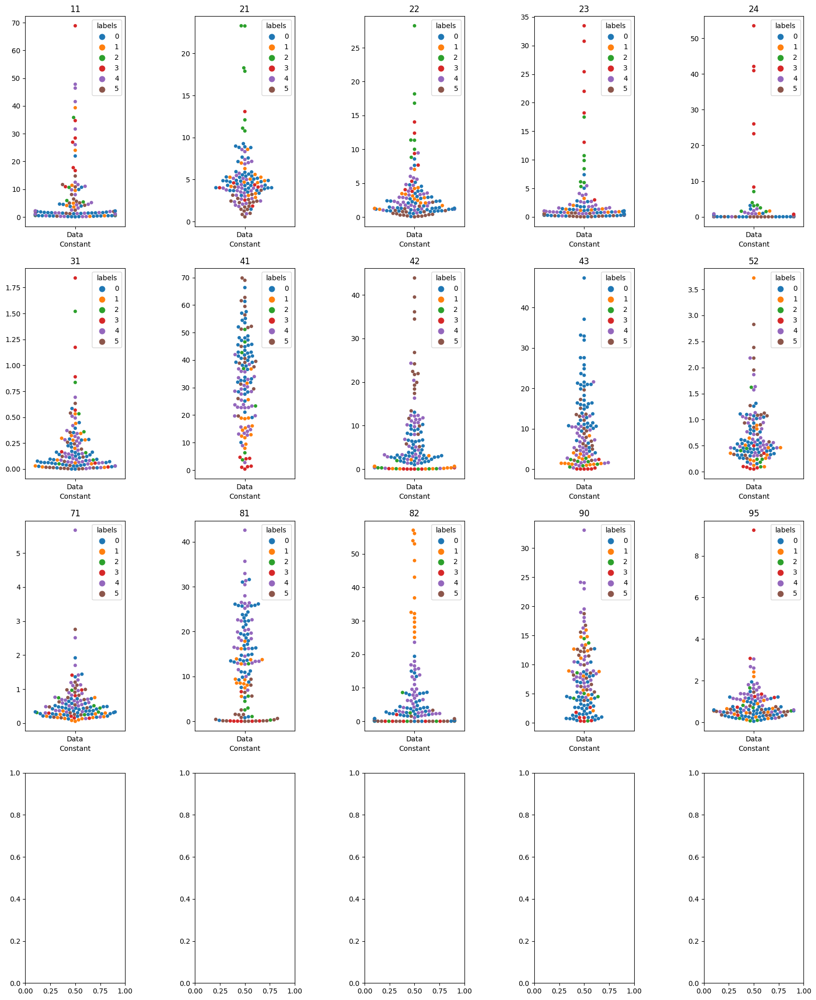

In [21]:
f, axes = plt.subplots(4, 5, figsize=(20, 25), sharex=False)
f.subplots_adjust(hspace=0.2, wspace=0.7)
for i in range(0, len(list(labeledClasses)) - 2):
    col = labeledClasses.columns[i]
    if i < 5:
        ax = sns.swarmplot(
            x=labeledClasses["Constant"],
            y=labeledClasses[col].values,
            hue=labeledClasses["labels"],
            ax=axes[0, (i)],
        )
        ax.set_title(col)
    elif i >= 5 and i < 10:
        ax = sns.swarmplot(
            x=labeledClasses["Constant"],
            y=labeledClasses[col].values,
            hue=labeledClasses["labels"],
            ax=axes[1, (i - 5)],
        )
        ax.set_title(col)
    elif i >= 10 and i < 15:
        ax = sns.swarmplot(
            x=labeledClasses["Constant"],
            y=labeledClasses[col].values,
            hue=labeledClasses["labels"],
            ax=axes[2, (i - 10)],
        )
        ax.set_title(col)
    elif i >= 15:
        ax = sns.swarmplot(
            x=labeledClasses["Constant"],
            y=labeledClasses[col].values,
            hue=labeledClasses["labels"],
            ax=axes[3, (i - 15)],
        )
        ax.set_title(col)

In [22]:
classes = df_lulc["station"]
classes = pd.concat((classes, labels), axis=1)
classes = classes.rename({"station": "station", 0: "Cluster"}, axis=1)
sortclasses = classes.sort_values(["station"])
pd.set_option("display.max_rows", 1000)
sortclasses["lon"] = ny_df_lons
sortclasses["lat"] = ny_df_lats

In [23]:
colors = [
    "black",
    "blue",
    "green",
    "red",
    "orange",
    "yellow",
    "white",
    "purple",
    "cyan",
    "plum",
    "coral",
    "pink",
]
legend = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

colordict = {}

for x, _ in enumerate(colors):
    colordict.update({legend[x]: colors[x]})

sortclasses["color"] = sortclasses["Cluster"].map(colordict)

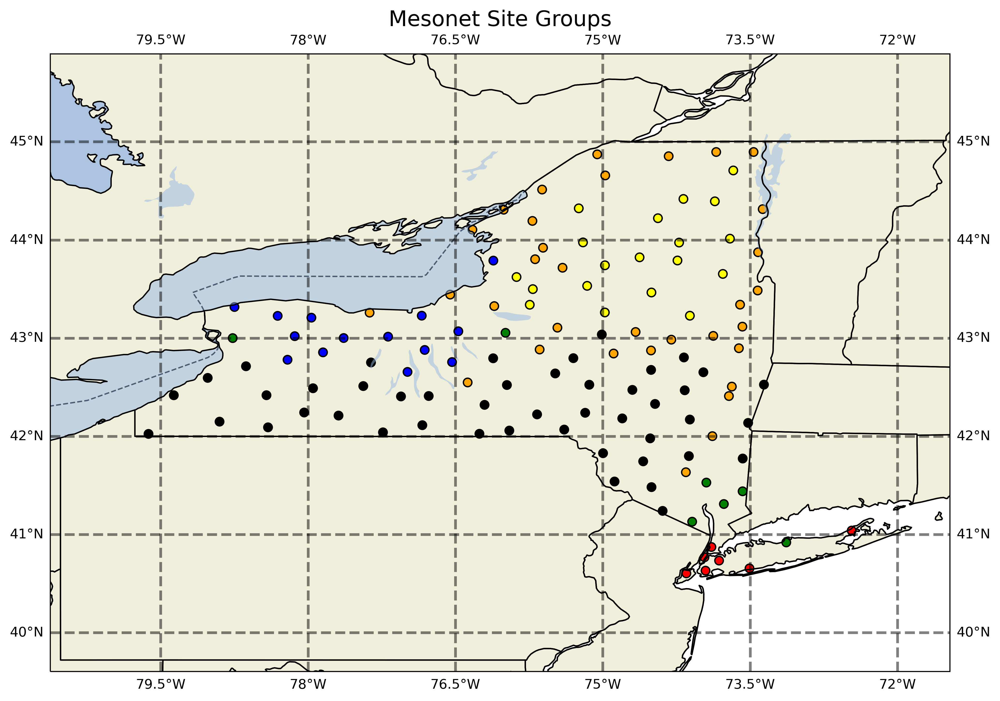

In [24]:
plurality_plot(sortclasses)

# Let's cluster on Elevation

In [25]:
elev_df = pd.read_csv("/home/aevans/landtype/elevation/data/NY/elev/ny30_df.csv")
elev_df.head()

,Unnamed: 0,station,elev,std,variance,skew,med_dist,lon,lat
0,0,ADDI,507.6140,78.927280,6227.304936,-0.137953,533.728027,-77.237259,42.040359
1,1,ANDE,518.2820,114.446243,13093.302806,0.554366,428.563965,-74.801392,42.182270
2,2,BATA,276.1200,81.741875,6679.365616,1.134595,325.239990,-78.135658,43.019939
3,3,BEAC,90.1598,77.445227,5995.644516,0.642901,43.319595,-73.945267,41.528751
4,4,BELD,470.3700,71.198890,5067.491291,-0.024945,520.739990,-75.668518,42.223221


In [26]:
# exclude the categorical columns
features_elev = elev_df.drop(["station", "Unnamed: 0", "lon", "lat"], axis=1)

In [27]:
# noramalize data
scaler = preprocessing.MinMaxScaler()
features_norm = scaler.fit_transform(features_elev)

In [28]:
pd.DataFrame(features_norm).describe()

,0,1,2,3,4
count,126.000000,126.000000,126.000000,126.000000,126.000000
mean,0.393459,0.341613,0.166600,0.484892,0.319716
std,0.251843,0.183900,0.155111,0.165858,0.177573
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.166734,0.217243,0.061724,0.381392,0.178185
50%,0.356824,0.358310,0.148031,0.477097,0.275500
75%,0.607616,0.438742,0.213534,0.569033,0.441567
max,1.000000,1.000000,1.000000,1.000000,1.000000


In [29]:
# kmeans clustering
inertia_elev = []
K = range(1, 15)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(features_norm)
    kmeanModel.fit(features_norm)
    inertia_elev.append(kmeanModel.inertia_)

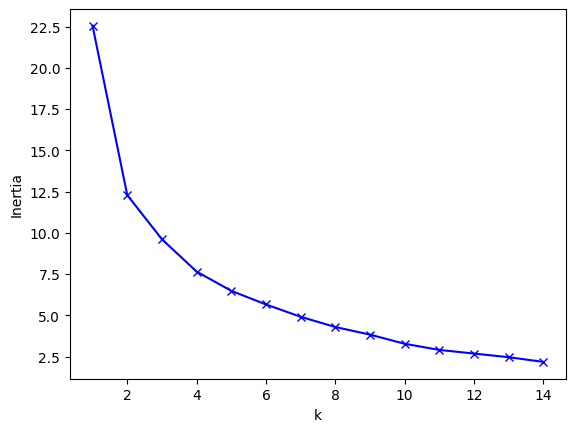

In [30]:
# Plot the elbow
plt.plot(K, inertia_elev, "bx-")
plt.xlabel("k")
plt.ylabel("Inertia")
plt.show()

In [31]:
# let's say our elbow is 12
kmeans_elev = KMeans(n_clusters=6).fit(features_norm)

In [32]:
labels_elev = pd.DataFrame(
    kmeans_elev.labels_
)  # This is where the label output of the KMeans we just ran lives. Make it a dataframe so we can concatenate back to the original data
labeledElev = pd.concat((features_elev, labels_elev), axis=1)
labeledElev = labeledElev.rename({0: "labels"}, axis=1)

In [33]:
labeledElev.head()

,elev,std,variance,skew,med_dist,labels
0,507.6140,78.927280,6227.304936,-0.137953,533.728027,4
1,518.2820,114.446243,13093.302806,0.554366,428.563965,4
2,276.1200,81.741875,6679.365616,1.134595,325.239990,1
3,90.1598,77.445227,5995.644516,0.642901,43.319595,3
4,470.3700,71.198890,5067.491291,-0.024945,520.739990,0


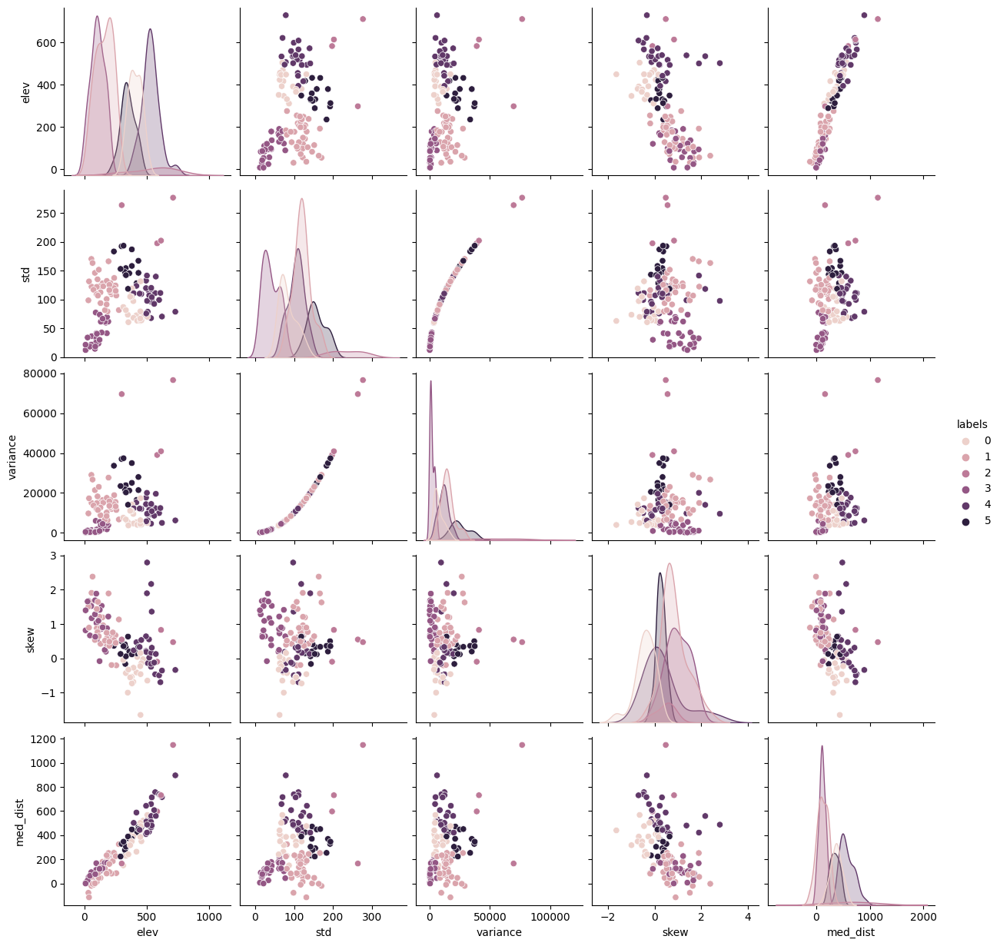

In [34]:
sns.pairplot(labeledElev, hue="labels")

In [35]:
labeledElev[
    "Constant"
] = "Data"  # This is just to add something constant for the strip/swarm plots' X axis. Can be anything you want it to be.

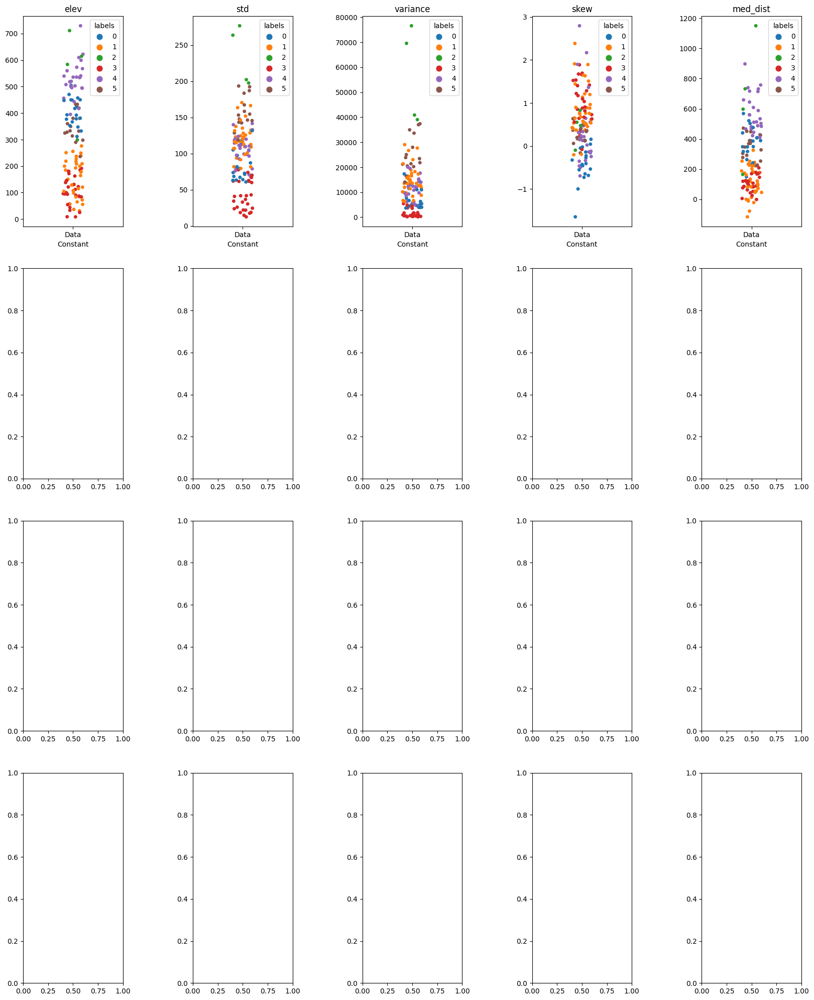

In [36]:
f, axes = plt.subplots(
    4, 5, figsize=(20, 25), sharex=False
)  # create a 4x5 grid of empty figures where we will plot our feature plots. We will have a couple empty ones.
f.subplots_adjust(hspace=0.2, wspace=0.7)  # Scooch em apart, give em some room
# In this for loop, I step through every column that I want to plot. This is a 4x5 grid, so I split this up by rows of 5 in the else if statements
for i in range(
    0, len(list(labeledElev)) - 2
):  # minus two because I don't want to plot labels or constant
    col = labeledElev.columns[i]
    if i < 5:
        ax = sns.stripplot(
            x=labeledElev["Constant"],
            y=labeledElev[col].values,
            hue=labeledElev["labels"],
            jitter=True,
            ax=axes[0, (i)],
        )
        ax.set_title(col)
    elif i >= 5 and i < 10:
        ax = sns.stripplot(
            x=labeledElev["Constant"],
            y=labeledElev[col].values,
            hue=labeledElev["labels"],
            jitter=True,
            ax=axes[1, (i - 5)],
        )  # so if i=6 it is row 1 column 1
        ax.set_title(col)
    elif i >= 10 and i < 15:
        ax = sns.stripplot(
            x=labeledElev["Constant"],
            y=labeledElev[col].values,
            hue=labeledElev["labels"],
            jitter=True,
            ax=axes[2, (i - 10)],
        )
        ax.set_title(col)
    elif i >= 15:
        ax = sns.stripplot(
            x=labeledElev["Constant"],
            y=labeledElev[col].values,
            hue=labeledElev["labels"],
            jitter=True,
            ax=axes[3, (i - 15)],
        )
        ax.set_title(col)

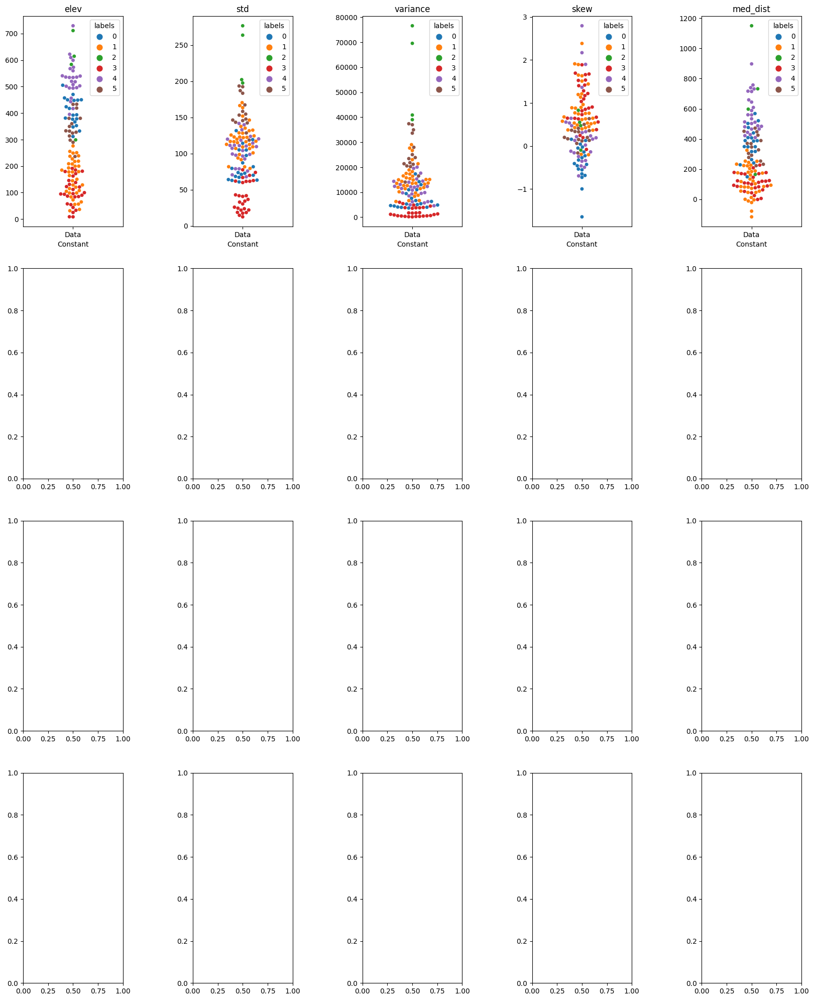

In [37]:
f, axes = plt.subplots(4, 5, figsize=(20, 25), sharex=False)
f.subplots_adjust(hspace=0.2, wspace=0.7)
for i in range(0, len(list(labeledElev)) - 2):
    col = labeledElev.columns[i]
    if i < 5:
        ax = sns.swarmplot(
            x=labeledElev["Constant"],
            y=labeledElev[col].values,
            hue=labeledElev["labels"],
            ax=axes[0, (i)],
        )
        ax.set_title(col)
    elif i >= 5 and i < 10:
        ax = sns.swarmplot(
            x=labeledElev["Constant"],
            y=labeledElev[col].values,
            hue=labeledElev["labels"],
            ax=axes[1, (i - 5)],
        )
        ax.set_title(col)
    elif i >= 10 and i < 15:
        ax = sns.swarmplot(
            x=labeledElev["Constant"],
            y=labeledElev[col].values,
            hue=labeledElev["labels"],
            ax=axes[2, (i - 10)],
        )
        ax.set_title(col)
    elif i >= 15:
        ax = sns.swarmplot(
            x=labeledElev["Constant"],
            y=labeledElev[col].values,
            hue=labeledElev["labels"],
            ax=axes[3, (i - 15)],
        )
        ax.set_title(col)

In [38]:
elevs = df_lulc["station"]
elevs = pd.concat((elevs, labels_elev), axis=1)
elevs = elevs.rename({"station": "station", 0: "Cluster"}, axis=1)
sortelevs = elevs.sort_values(["station"])
pd.set_option("display.max_rows", 1000)
sortelevs["lon"] = ny_df_lons
sortelevs["lat"] = ny_df_lats

In [39]:
colors = [
    "black",
    "blue",
    "green",
    "red",
    "orange",
    "yellow",
    "white",
    "purple",
    "cyan",
    "plum",
    "coral",
    "pink",
]
legend = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

colordict = {}

for x, _ in enumerate(colors):
    colordict.update({legend[x]: colors[x]})

sortelevs["color"] = sortelevs["Cluster"].map(colordict)

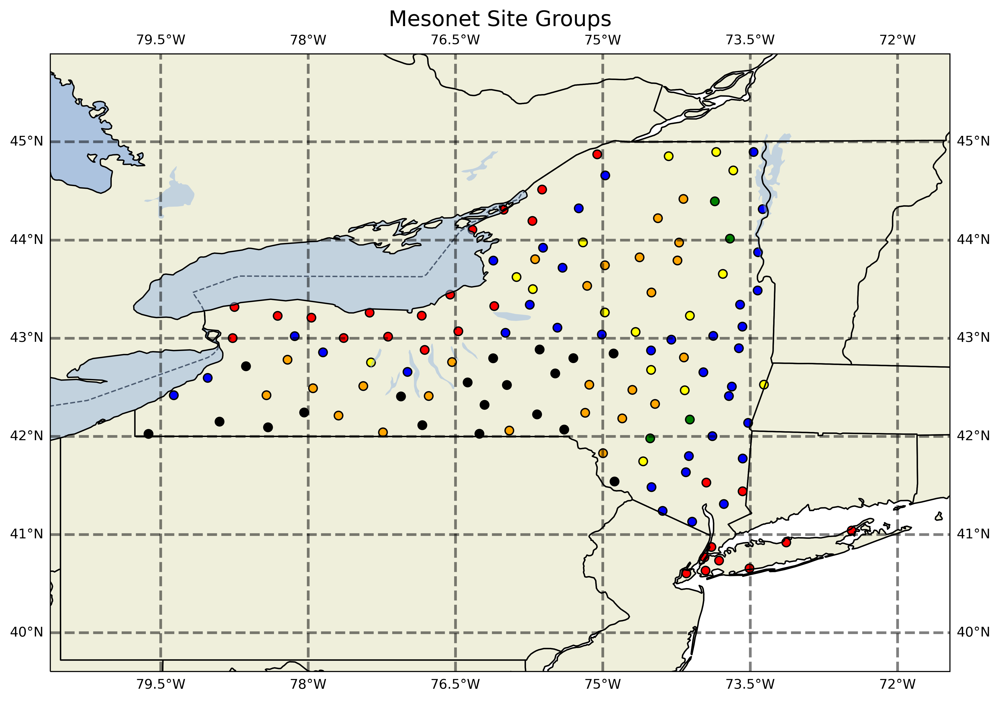

In [40]:
plurality_plot(sortelevs)

# let's cluster on slope

In [41]:
slope_df = pd.read_csv(
    "/home/aevans/landtype/elevation/data/NY/slope/sl_percent_30.csv"
)
slope_df.head()

,site,19,21,22,23,24,25,26,27,28,33,37,32,34,38,31,35,36,station
0,0,78.362573,2.850877,3.070175,2.521930,2.960526,1.937135,2.668129,2.558480,3.070175,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,ADDI
1,1,52.497343,6.269926,3.719447,6.836699,5.419766,4.321644,6.269926,6.695005,7.970244,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,ANDE
2,2,98.319942,0.000000,0.073046,0.840029,0.073046,0.000000,0.000000,0.438276,0.255661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BATA
3,3,87.073609,0.825853,1.077199,3.590664,1.184919,0.179533,0.897666,3.123878,2.046679,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BEAC
4,4,83.398093,1.377605,2.225362,2.366655,0.812434,1.059696,1.695514,3.708937,3.355705,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BELD


In [42]:
# exclude the categorical columns
features_slope = slope_df.drop(["site", "station"], axis=1)

In [43]:
# noramalize data
scaler = preprocessing.MinMaxScaler()
features_norm_sl = scaler.fit_transform(features_slope)

In [44]:
pd.DataFrame(features_norm_sl).describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
count,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000,126.000000
mean,0.748601,0.165735,0.204936,0.203540,0.148126,0.130909,0.206674,0.251765,0.211425,0.036591,0.038569,0.025088,0.042020,0.019902,0.026150,0.015782,0.007937
std,0.240722,0.198279,0.204064,0.215429,0.192802,0.193027,0.228206,0.240179,0.228522,0.147991,0.153581,0.117961,0.187105,0.122688,0.134467,0.124769,0.089087
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.611785,0.004318,0.034661,0.022407,0.003760,0.000000,0.000000,0.023261,0.004561,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.784605,0.104636,0.147624,0.145285,0.063645,0.064457,0.137074,0.218686,0.165747,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.969044,0.247014,0.286698,0.310624,0.229507,0.173910,0.314237,0.406743,0.321628,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [45]:
# kmeans clustering
inertia_slope = []
K = range(1, 15)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(features_norm_sl)
    kmeanModel.fit(features_norm_sl)
    inertia_slope.append(kmeanModel.inertia_)

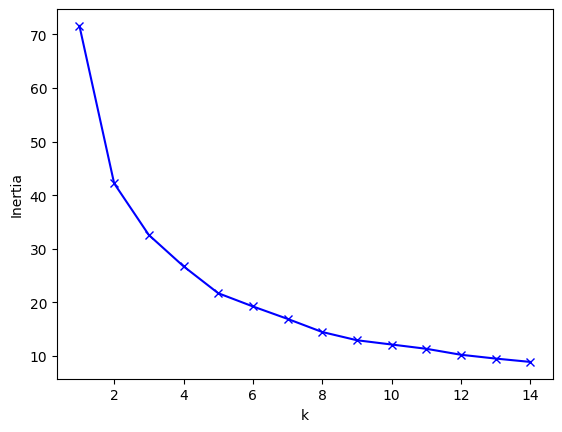

In [46]:
# Plot the elbow
plt.plot(K, inertia_slope, "bx-")
plt.xlabel("k")
plt.ylabel("Inertia")
plt.show()

In [47]:
# let's say our elbow is 12
kmeans_slope = KMeans(n_clusters=6).fit(features_norm_sl)

In [48]:
labels_slope = pd.DataFrame(
    kmeans_slope.labels_
)  # This is where the label output of the KMeans we just ran lives. Make it a dataframe so we can concatenate back to the original data
labeledSlope = pd.concat((features_slope, labels_slope), axis=1)
labeledSlope = labeledSlope.rename({0: "labels"}, axis=1)

In [49]:
labeledSlope.head()

,19,21,22,23,24,25,26,27,28,33,37,32,34,38,31,35,36,labels
0,78.362573,2.850877,3.070175,2.521930,2.960526,1.937135,2.668129,2.558480,3.070175,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,52.497343,6.269926,3.719447,6.836699,5.419766,4.321644,6.269926,6.695005,7.970244,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
2,98.319942,0.000000,0.073046,0.840029,0.073046,0.000000,0.000000,0.438276,0.255661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
3,87.073609,0.825853,1.077199,3.590664,1.184919,0.179533,0.897666,3.123878,2.046679,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4,83.398093,1.377605,2.225362,2.366655,0.812434,1.059696,1.695514,3.708937,3.355705,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1


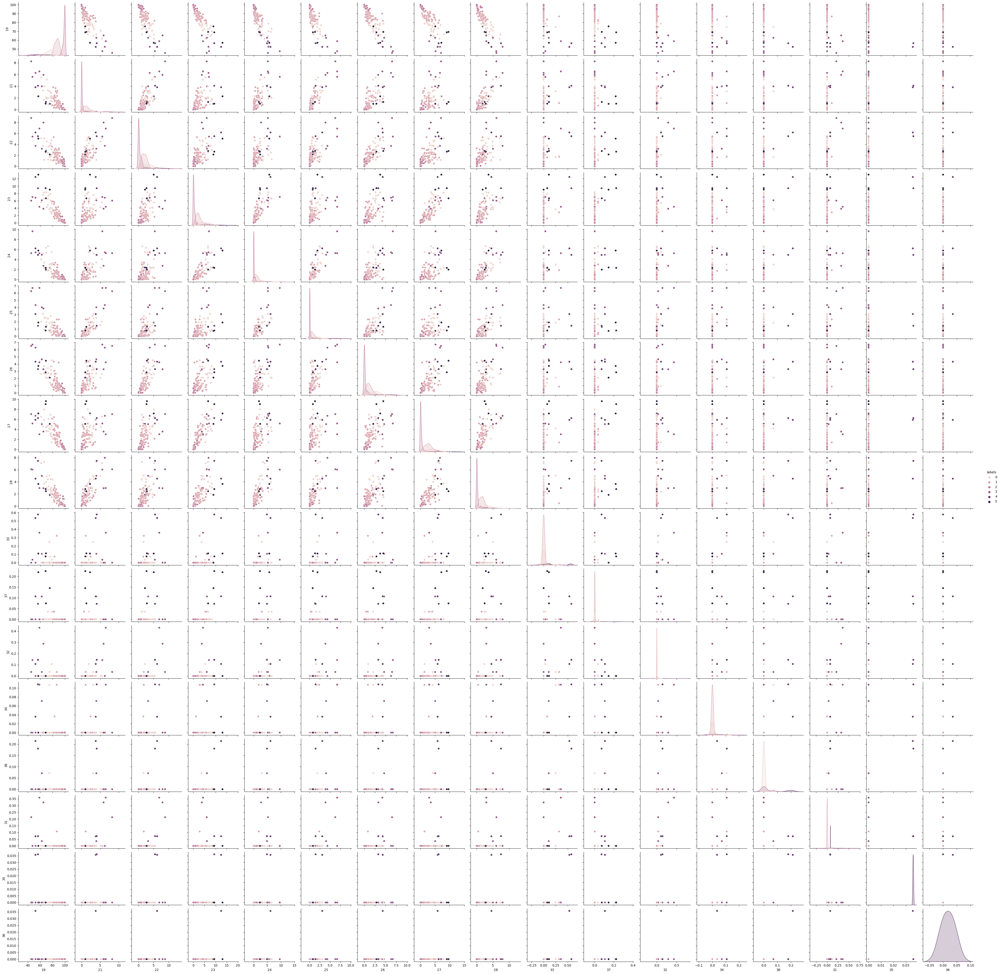

In [50]:
sns.pairplot(labeledSlope, hue="labels")

In [51]:
labeledSlope[
    "Constant"
] = "Data"  # This is just to add something constant for the strip/swarm plots' X axis. Can be anything you want it to be.

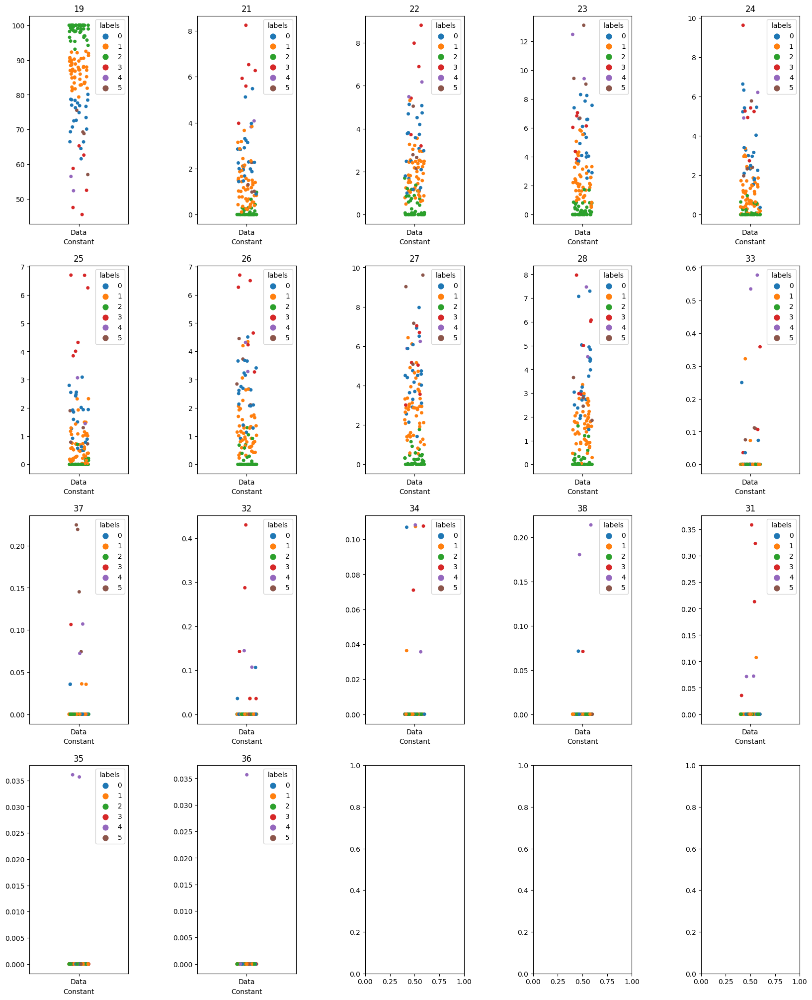

In [52]:
f, axes = plt.subplots(
    4, 5, figsize=(20, 25), sharex=False
)  # create a 4x5 grid of empty figures where we will plot our feature plots. We will have a couple empty ones.
f.subplots_adjust(hspace=0.2, wspace=0.7)  # Scooch em apart, give em some room
# In this for loop, I step through every column that I want to plot. This is a 4x5 grid, so I split this up by rows of 5 in the else if statements
for i in range(
    0, len(list(labeledSlope)) - 2
):  # minus two because I don't want to plot labels or constant
    col = labeledSlope.columns[i]
    if i < 5:
        ax = sns.stripplot(
            x=labeledSlope["Constant"],
            y=labeledSlope[col].values,
            hue=labeledSlope["labels"],
            jitter=True,
            ax=axes[0, (i)],
        )
        ax.set_title(col)
    elif i >= 5 and i < 10:
        ax = sns.stripplot(
            x=labeledSlope["Constant"],
            y=labeledSlope[col].values,
            hue=labeledSlope["labels"],
            jitter=True,
            ax=axes[1, (i - 5)],
        )  # so if i=6 it is row 1 column 1
        ax.set_title(col)
    elif i >= 10 and i < 15:
        ax = sns.stripplot(
            x=labeledSlope["Constant"],
            y=labeledSlope[col].values,
            hue=labeledSlope["labels"],
            jitter=True,
            ax=axes[2, (i - 10)],
        )
        ax.set_title(col)
    elif i >= 15:
        ax = sns.stripplot(
            x=labeledSlope["Constant"],
            y=labeledSlope[col].values,
            hue=labeledSlope["labels"],
            jitter=True,
            ax=axes[3, (i - 15)],
        )
        ax.set_title(col)

/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 13.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 7.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 5.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 17.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/aevans/.local/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarni

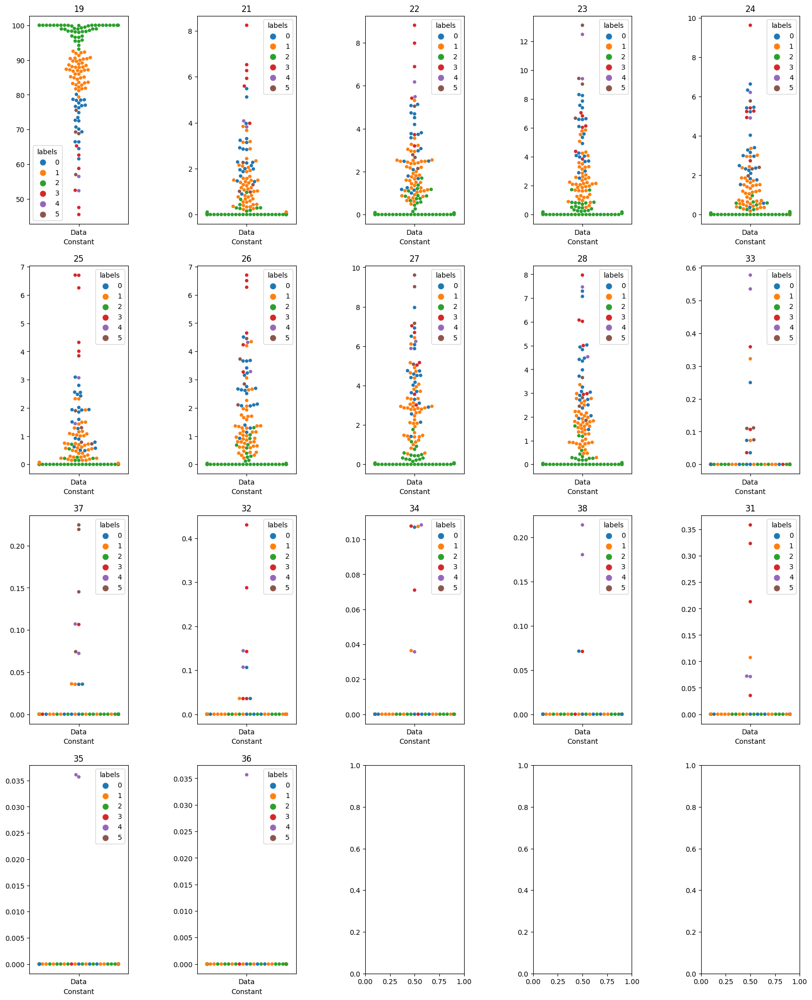

In [53]:
f, axes = plt.subplots(4, 5, figsize=(20, 25), sharex=False)
f.subplots_adjust(hspace=0.2, wspace=0.7)
for i in range(0, len(list(labeledSlope)) - 2):
    col = labeledSlope.columns[i]
    if i < 5:
        ax = sns.swarmplot(
            x=labeledSlope["Constant"],
            y=labeledSlope[col].values,
            hue=labeledSlope["labels"],
            ax=axes[0, (i)],
        )
        ax.set_title(col)
    elif i >= 5 and i < 10:
        ax = sns.swarmplot(
            x=labeledSlope["Constant"],
            y=labeledSlope[col].values,
            hue=labeledSlope["labels"],
            ax=axes[1, (i - 5)],
        )
        ax.set_title(col)
    elif i >= 10 and i < 15:
        ax = sns.swarmplot(
            x=labeledSlope["Constant"],
            y=labeledSlope[col].values,
            hue=labeledSlope["labels"],
            ax=axes[2, (i - 10)],
        )
        ax.set_title(col)
    elif i >= 15:
        ax = sns.swarmplot(
            x=labeledSlope["Constant"],
            y=labeledSlope[col].values,
            hue=labeledSlope["labels"],
            ax=axes[3, (i - 15)],
        )
        ax.set_title(col)

In [54]:
slopes = df_lulc["station"]
slopes = pd.concat((slopes, labels_slope), axis=1)
slopes = slopes.rename({"station": "station", 0: "Cluster"}, axis=1)
sortslopes = slopes.sort_values(["station"])
pd.set_option("display.max_rows", 1000)
sortslopes["lon"] = ny_df_lons
sortslopes["lat"] = ny_df_lats

In [55]:
colors = [
    "black",
    "blue",
    "green",
    "red",
    "orange",
    "yellow",
    "white",
    "purple",
    "cyan",
    "plum",
    "coral",
    "pink",
]
legend = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

colordict = {}

for x, _ in enumerate(colors):
    colordict.update({legend[x]: colors[x]})

sortslopes["color"] = sortslopes["Cluster"].map(colordict)

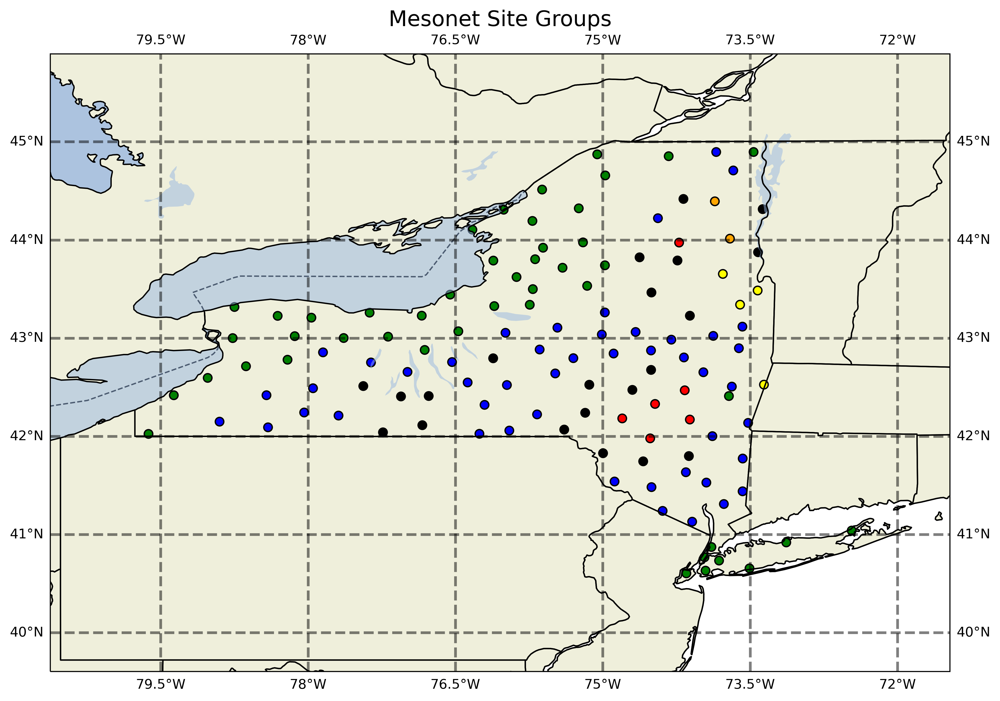

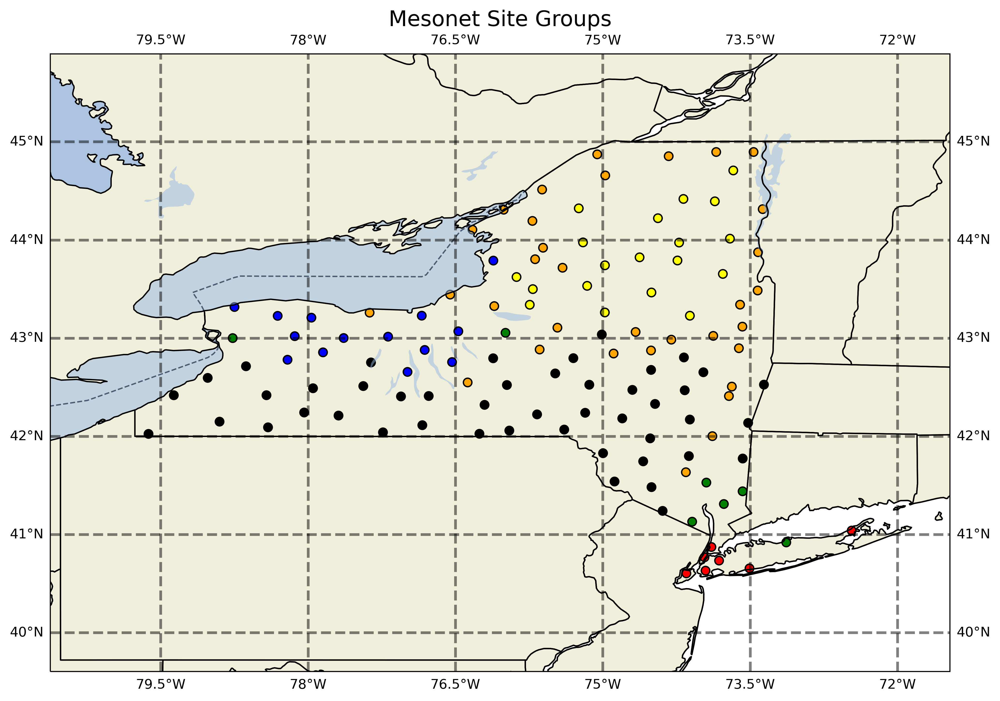

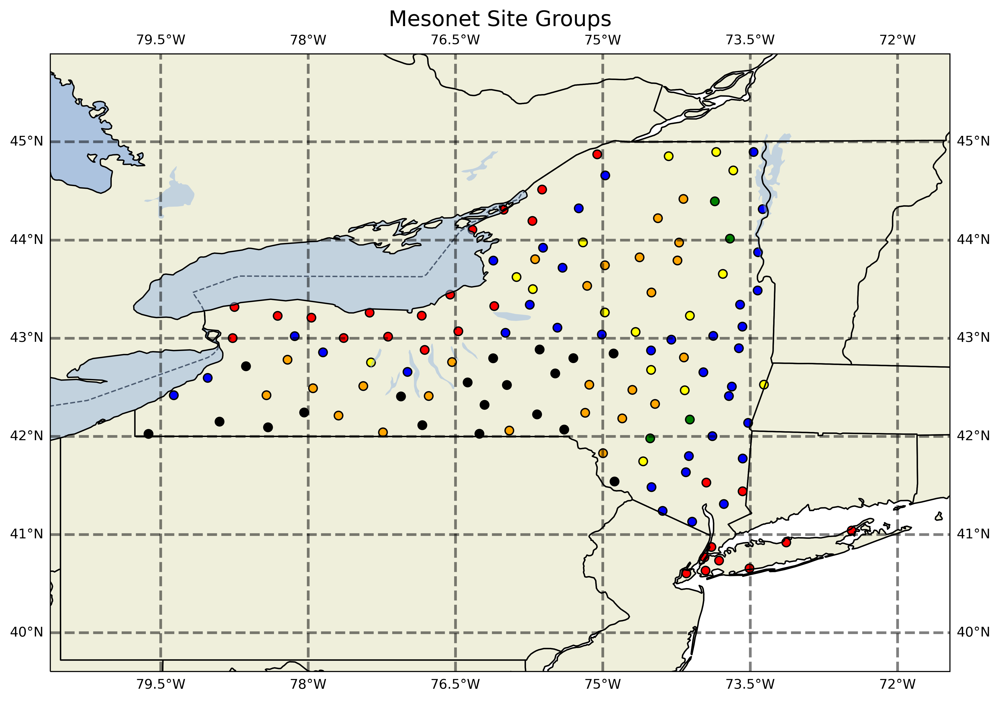

In [56]:
plurality_plot(sortslopes)
plurality_plot(sortclasses)
plurality_plot(sortelevs)

# Let's cluster on all vars

In [57]:
comb = pd.merge(df_lulc, elev_df, on="station")
comb.head()

,site,11,21,22,23,24,31,41,42,43,...,95,station,Unnamed: 0,elev,std,variance,skew,med_dist,lon,lat
0,1,1.962930,5.647257,1.299929,0.483068,0.109736,0.137242,29.370894,3.830164,25.780258,...,0.554411,ADDI,0,507.6140,78.927280,6227.304936,-0.137953,533.728027,-77.237259,42.040359
1,2,1.820203,4.007140,0.595656,0.093976,0.009168,0.090537,66.349595,2.819553,11.070490,...,0.103430,ANDE,1,518.2820,114.446243,13093.302806,0.554366,428.563965,-74.801392,42.182270
2,3,0.697071,5.277453,4.213367,2.021878,0.932866,0.281350,7.929932,0.161303,1.428809,...,1.017672,BATA,2,276.1200,81.741875,6679.365616,1.134595,325.239990,-78.135658,43.019939
3,4,10.653124,11.111843,10.012464,9.876366,3.972609,0.532928,42.712777,0.089967,0.535507,...,0.546395,BEAC,3,90.1598,77.445227,5995.644516,0.642901,43.319595,-73.945267,41.528751
4,5,0.649265,4.491848,1.082204,0.356723,0.039254,0.121773,28.382281,6.408126,31.918283,...,0.314318,BELD,4,470.3700,71.198890,5067.491291,-0.024945,520.739990,-75.668518,42.223221


In [58]:
comb_df = pd.merge(comb, slope_df, on="station")

In [59]:
comb_df.head()

,site_x,11,21_x,22_x,23_x,24_x,31_x,41,42,43,...,27,28,33,37,32,34,38,31_y,35,36
0,1,1.962930,5.647257,1.299929,0.483068,0.109736,0.137242,29.370894,3.830164,25.780258,...,2.558480,3.070175,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,1.820203,4.007140,0.595656,0.093976,0.009168,0.090537,66.349595,2.819553,11.070490,...,6.695005,7.970244,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,0.697071,5.277453,4.213367,2.021878,0.932866,0.281350,7.929932,0.161303,1.428809,...,0.438276,0.255661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,10.653124,11.111843,10.012464,9.876366,3.972609,0.532928,42.712777,0.089967,0.535507,...,3.123878,2.046679,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,0.649265,4.491848,1.082204,0.356723,0.039254,0.121773,28.382281,6.408126,31.918283,...,3.708937,3.355705,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [60]:
features_all = comb_df.drop(
    ["site_x", "station", "variance", "Unnamed: 0", "lon", "lat", "site_y"], axis=1
)
features_all.head()

,11,21_x,22_x,23_x,24_x,31_x,41,42,43,52,...,27,28,33,37,32,34,38,31_y,35,36
0,1.962930,5.647257,1.299929,0.483068,0.109736,0.137242,29.370894,3.830164,25.780258,0.441523,...,2.558480,3.070175,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.820203,4.007140,0.595656,0.093976,0.009168,0.090537,66.349595,2.819553,11.070490,0.875577,...,6.695005,7.970244,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.697071,5.277453,4.213367,2.021878,0.932866,0.281350,7.929932,0.161303,1.428809,0.209436,...,0.438276,0.255661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,10.653124,11.111843,10.012464,9.876366,3.972609,0.532928,42.712777,0.089967,0.535507,0.405427,...,3.123878,2.046679,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.649265,4.491848,1.082204,0.356723,0.039254,0.121773,28.382281,6.408126,31.918283,0.320048,...,3.708937,3.355705,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [61]:
features_all.keys()

Index(['11', '21_x', '22_x', '23_x', '24_x', '31_x', '41', '42', '43', '52',
       '71', '81', '82', '90', '95', 'elev', 'std', 'skew', 'med_dist', '19',
       '21_y', '22_y', '23_y', '24_y', '25', '26', '27', '28', '33', '37',
       '32', '34', '38', '31_y', '35', '36'],
      dtype='object')

In [62]:
features_all.to_csv("/home/aevans/landtype/notebooks/features.csv")

In [63]:
features_all.head()

,11,21_x,22_x,23_x,24_x,31_x,41,42,43,52,...,27,28,33,37,32,34,38,31_y,35,36
0,1.962930,5.647257,1.299929,0.483068,0.109736,0.137242,29.370894,3.830164,25.780258,0.441523,...,2.558480,3.070175,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.820203,4.007140,0.595656,0.093976,0.009168,0.090537,66.349595,2.819553,11.070490,0.875577,...,6.695005,7.970244,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.697071,5.277453,4.213367,2.021878,0.932866,0.281350,7.929932,0.161303,1.428809,0.209436,...,0.438276,0.255661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,10.653124,11.111843,10.012464,9.876366,3.972609,0.532928,42.712777,0.089967,0.535507,0.405427,...,3.123878,2.046679,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.649265,4.491848,1.082204,0.356723,0.039254,0.121773,28.382281,6.408126,31.918283,0.320048,...,3.708937,3.355705,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [64]:
# noramalize data
scaler = preprocessing.MinMaxScaler()
features_norm_a = scaler.fit_transform(features_all)

In [65]:
# kmeans clustering
inertia_elev = []
K = range(1, 40)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(features_norm_a)
    kmeanModel.fit(features_norm_a)
    inertia_elev.append(kmeanModel.inertia_)

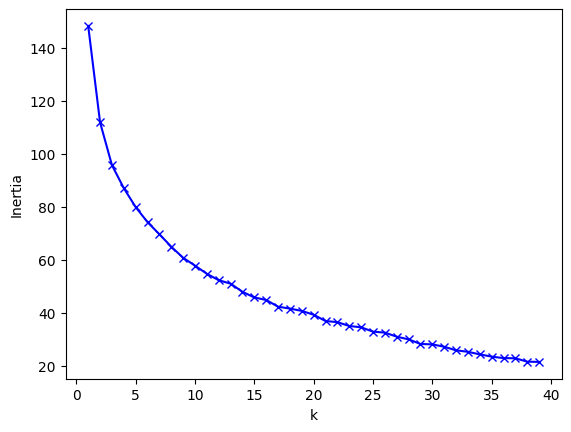

In [66]:
# Plot the elbow
plt.plot(K, inertia_elev, "bx-")
plt.xlabel("k")
plt.ylabel("Inertia")
plt.show()

In [67]:
# let's say our elbow is 12
kmeans_all = KMeans(n_clusters=8).fit(features_norm_a)

In [68]:
features_all.head()

,11,21_x,22_x,23_x,24_x,31_x,41,42,43,52,...,27,28,33,37,32,34,38,31_y,35,36
0,1.962930,5.647257,1.299929,0.483068,0.109736,0.137242,29.370894,3.830164,25.780258,0.441523,...,2.558480,3.070175,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.820203,4.007140,0.595656,0.093976,0.009168,0.090537,66.349595,2.819553,11.070490,0.875577,...,6.695005,7.970244,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.697071,5.277453,4.213367,2.021878,0.932866,0.281350,7.929932,0.161303,1.428809,0.209436,...,0.438276,0.255661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,10.653124,11.111843,10.012464,9.876366,3.972609,0.532928,42.712777,0.089967,0.535507,0.405427,...,3.123878,2.046679,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.649265,4.491848,1.082204,0.356723,0.039254,0.121773,28.382281,6.408126,31.918283,0.320048,...,3.708937,3.355705,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [69]:
labels_a = pd.DataFrame(
    kmeans_all.labels_
)  # This is where the label output of the KMeans we just ran lives. Make it a dataframe so we can concatenate back to the original data
labeledAll = pd.concat((features_all, labels_a), axis=1)
labeledAll = labeledAll.rename({0: "labels"}, axis=1)

In [70]:
labeledAll.head()

,11,21_x,22_x,23_x,24_x,31_x,41,42,43,52,...,28,33,37,32,34,38,31_y,35,36,labels
0,1.962930,5.647257,1.299929,0.483068,0.109736,0.137242,29.370894,3.830164,25.780258,0.441523,...,3.070175,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
1,1.820203,4.007140,0.595656,0.093976,0.009168,0.090537,66.349595,2.819553,11.070490,0.875577,...,7.970244,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
2,0.697071,5.277453,4.213367,2.021878,0.932866,0.281350,7.929932,0.161303,1.428809,0.209436,...,0.255661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7
3,10.653124,11.111843,10.012464,9.876366,3.972609,0.532928,42.712777,0.089967,0.535507,0.405427,...,2.046679,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
4,0.649265,4.491848,1.082204,0.356723,0.039254,0.121773,28.382281,6.408126,31.918283,0.320048,...,3.355705,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2


In [71]:
# sns.pairplot(labeledAll,hue='labels')

In [72]:
labeledAll[
    "Constant"
] = "Data"  # This is just to add something constant for the strip/swarm plots' X axis. Can be anything you want it to be.

In [73]:
# f, axes = plt.subplots(4, 5, figsize=(20, 25), sharex=False) #create a 4x5 grid of empty figures where we will plot our feature plots. We will have a couple empty ones.
# f.subplots_adjust(hspace=0.2, wspace=0.7) #Scooch em apart, give em some room
# #In this for loop, I step through every column that I want to plot. This is a 4x5 grid, so I split this up by rows of 5 in the else if statements
# for i in range(0,len(list(labeledAll))-2): #minus two because I don't want to plot labels or constant
#     col = labeledAll.columns[i]
#     if i < 5:
#         ax = sns.stripplot(x=labeledAll['Constant'],y=labeledAll[col].values,hue=labeledAll['labels'],jitter=True,ax=axes[0,(i)])
#         ax.set_title(col)
#     elif i >= 5 and i<10:
#         ax = sns.stripplot(x=labeledAll['Constant'],y=labeledAll[col].values,hue=labeledAll['labels'],jitter=True,ax=axes[1,(i-5)]) #so if i=6 it is row 1 column 1
#         ax.set_title(col)
#     elif i >= 10 and i<15:
#         ax = sns.stripplot(x=labeledAll['Constant'],y=labeledAll[col].values,hue=labeledAll['labels'],jitter=True,ax=axes[2,(i-10)])
#         ax.set_title(col)
#     elif i >= 15 and i<20:
#         ax = sns.stripplot(x=labeledAll['Constant'],y=labeledAll[col].values,hue=labeledAll['labels'],jitter=True,ax=axes[3,(i-15)])
#         ax.set_title(col)
#     elif i >= 20:
#         ax = sns.stripplot(x=labeledAll['Constant'],y=labeledAll[col].values,hue=labeledAll['labels'],jitter=True,ax=axes[4,(i-20)])
#         ax.set_title(col)

In [74]:
# f, axes = plt.subplots(4, 5, figsize=(20, 25), sharex=False)
# f.subplots_adjust(hspace=0.2, wspace=0.7)
# for i in range(0,len(list(labeledAll))-2):
#     col = labeledAll.columns[i]
#     if i < 5:
#         ax = sns.swarmplot(x=labeledAll['Constant'],y=labeledAll[col].values,hue=labeledAll['labels'],ax=axes[0,(i)])
#         ax.set_title(col)
#     elif i >= 5 and i<10:
#         ax = sns.swarmplot(x=labeledAll['Constant'],y=labeledAll[col].values,hue=labeledAll['labels'],ax=axes[1,(i-5)])
#         ax.set_title(col)
#     elif i >= 10 and i<15:
#         ax = sns.swarmplot(x=labeledAll['Constant'],y=labeledAll[col].values,hue=labeledAll['labels'],ax=axes[2,(i-10)])
#         ax.set_title(col)
#     elif i >= 15 and i <20:
#         ax = sns.swarmplot(x=labeledAll['Constant'],y=labeledAll[col].values,hue=labeledAll['labels'],ax=axes[3,(i-15)])
#         ax.set_title(col)
#     elif i >= 20:
#         ax = sns.stripplot(x=labeledAll['Constant'],y=labeledAll[col].values,hue=labeledAll['labels'],jitter=True,ax=axes[3,(i-20)])
#         ax.set_title(col)

In [75]:
alls = df_lulc["station"]
alls = pd.concat((alls, labels_a), axis=1)
alls = alls.rename({"station": "station", 0: "Cluster"}, axis=1)
sortAll = alls.sort_values(["station"])
pd.set_option("display.max_rows", 1000)
sortAll["lon"] = ny_df_lons
sortAll["lat"] = ny_df_lats

In [76]:
colors = [
    "black",
    "blue",
    "white",
    "coral",
    "pink",
    "red",
    "magenta",
    "gray",
    "lime",
    "forestgreen",
    "green",
    "olive",
    "brown",
    "slategray",
    "darkorchid",
    "plum",
    "indigo",
    "purple",
    "yellow",
    "gold",
    "orange",
    "cyan",
]
legend = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]

colordict = {}

for x, _ in enumerate(colors):
    colordict.update({legend[x]: colors[x]})

sortAll["color"] = sortAll["Cluster"].map(colordict)

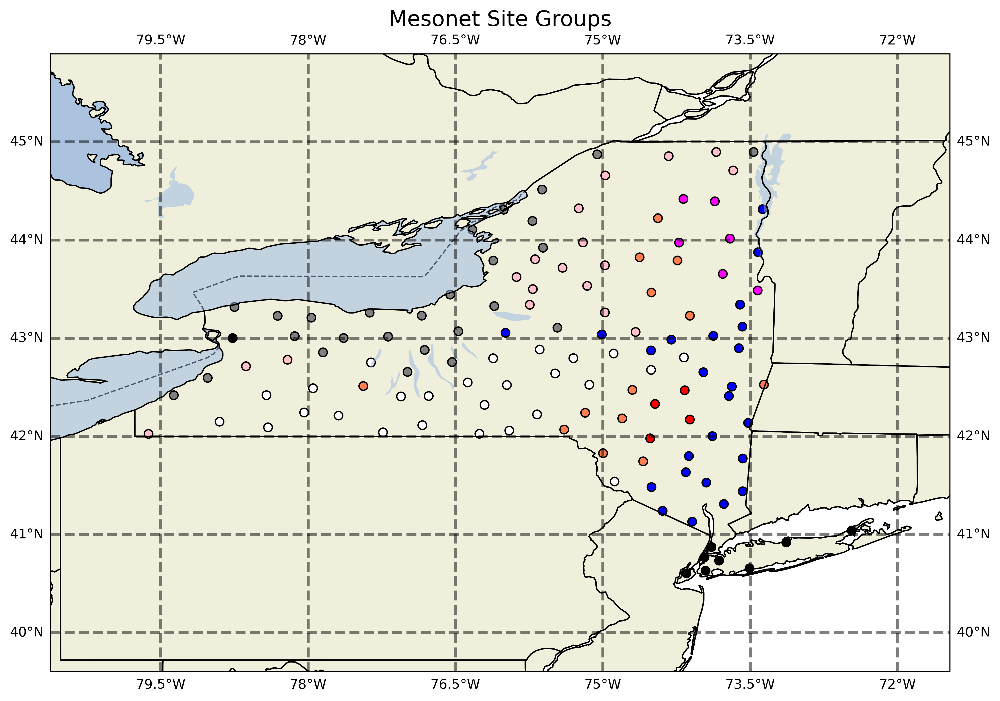

In [77]:
plurality_plot(sortAll)

In [78]:
sortAll.head()

,station,Cluster,lon,lat,color
0,ADDI,2,-77.237259,42.040359,white
1,ANDE,3,-74.801392,42.182270,coral
2,BATA,7,-78.135658,43.019939,gray
3,BEAC,1,-73.945267,41.528751,blue
4,BELD,2,-75.668518,42.223221,white


In [79]:
df_land = pd.read_csv("/home/aevans/landtype/data/buffer_10_km/avg_lulc_ny_10.csv")

CRSError: Invalid projection: +proj=lcc +ellps=WGS84 +lon_0=nan +lat_0=nan +x_0=0.0 +y_0=0.0 +lat_1=33 +lat_2=45 +no_defs +type=crs: (Internal Proj Error: proj_create: invalid value for lat_0)

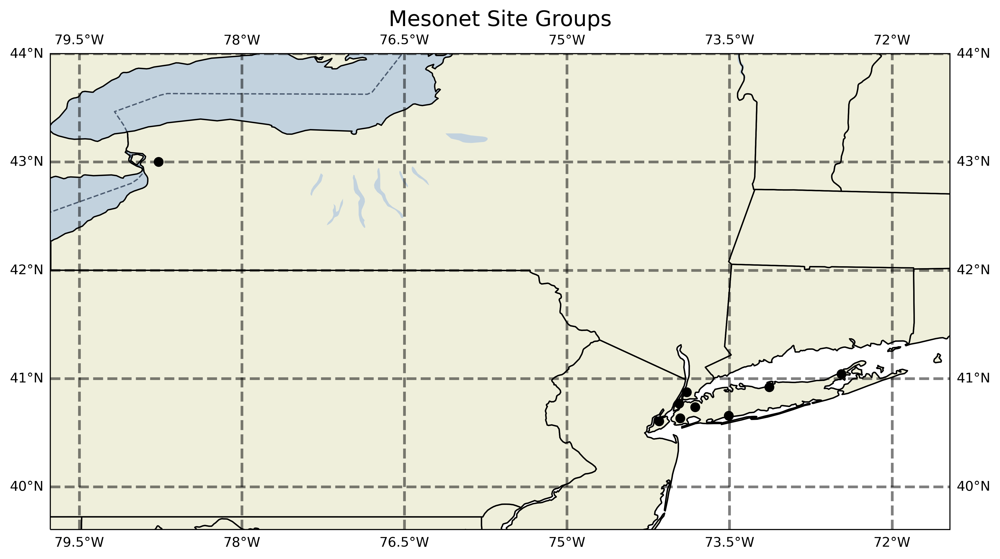

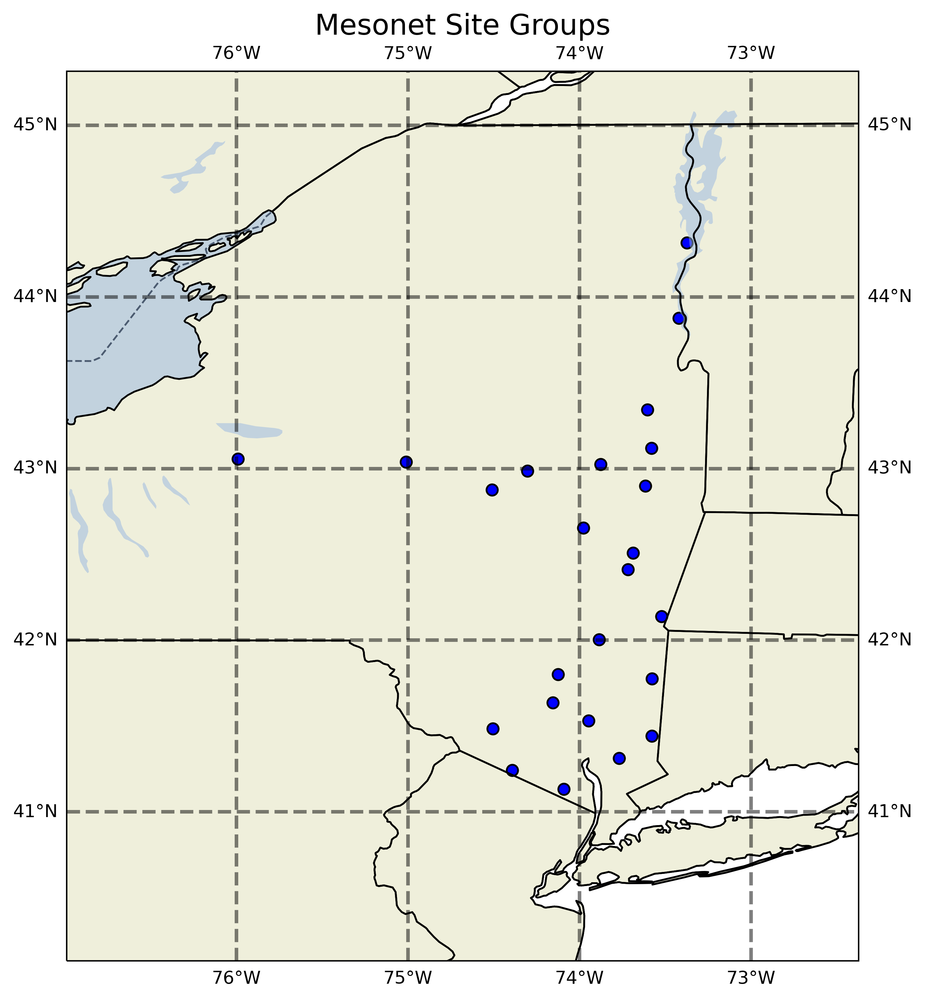

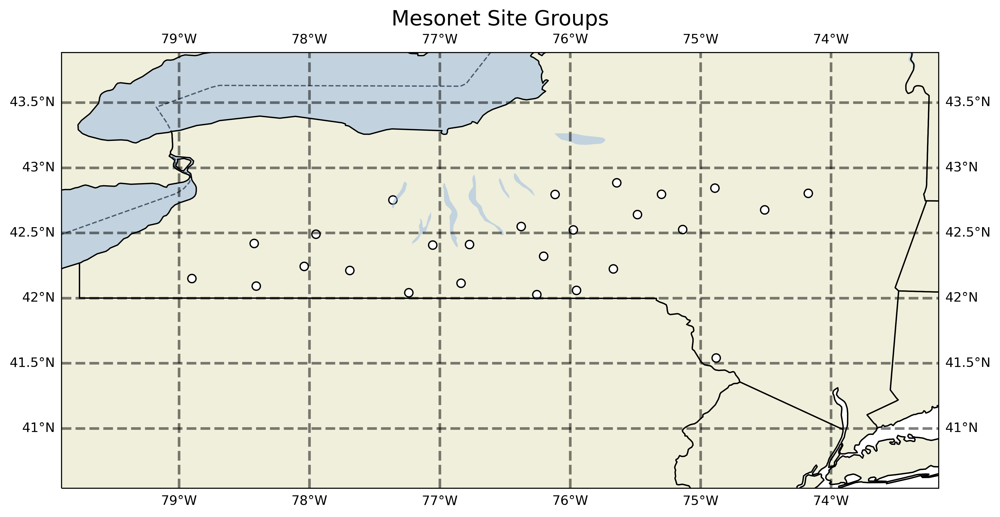

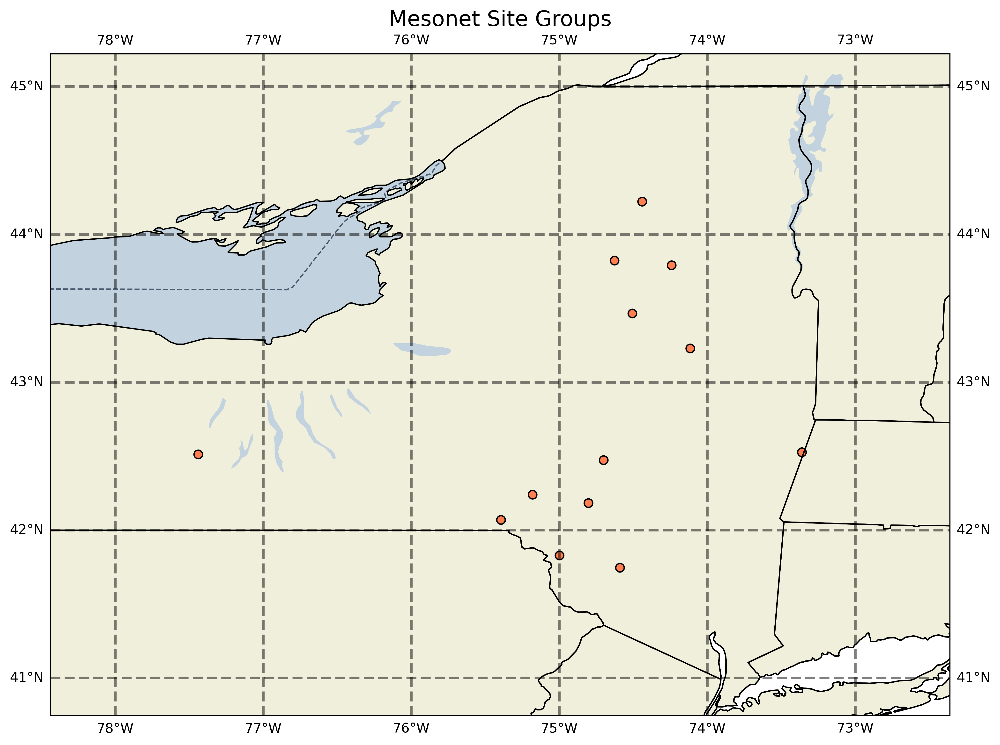

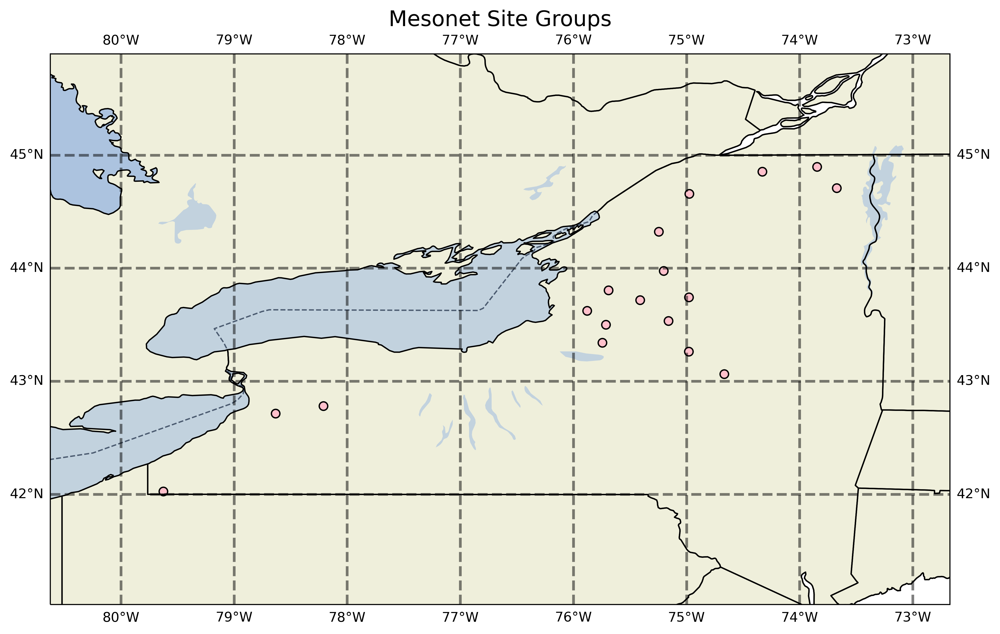

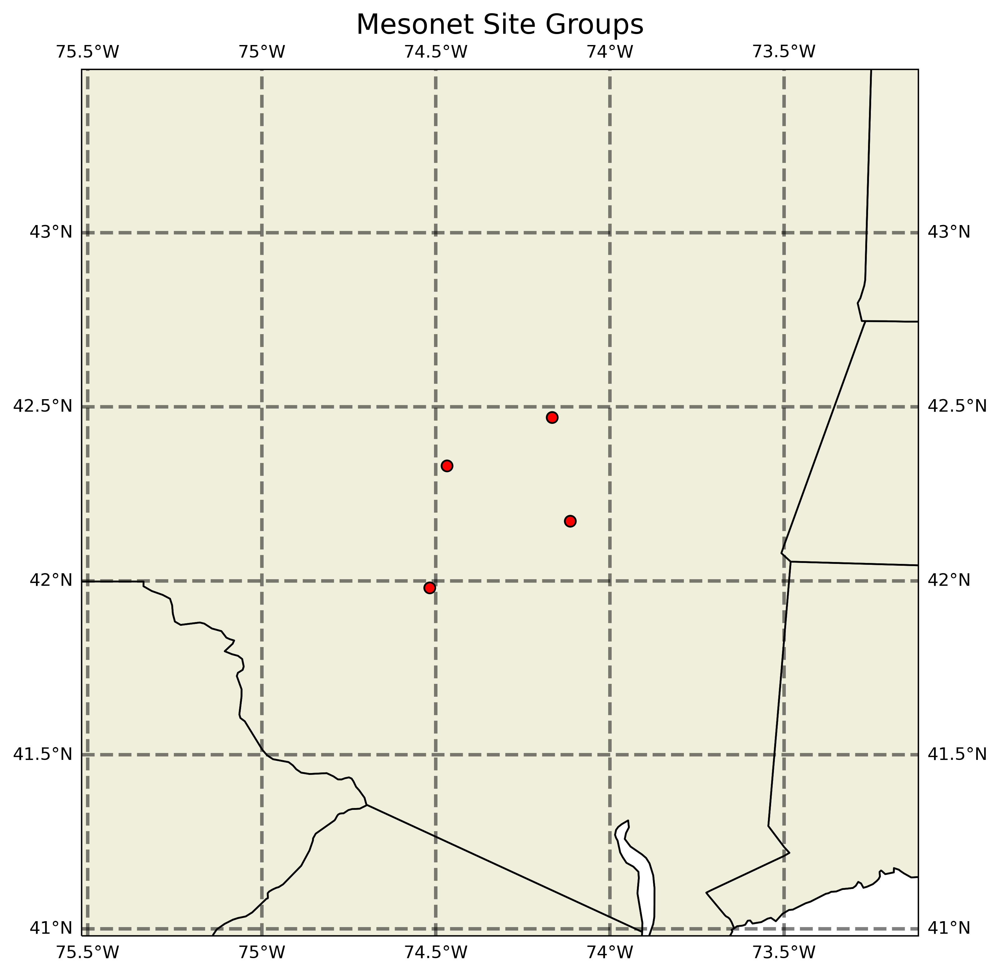

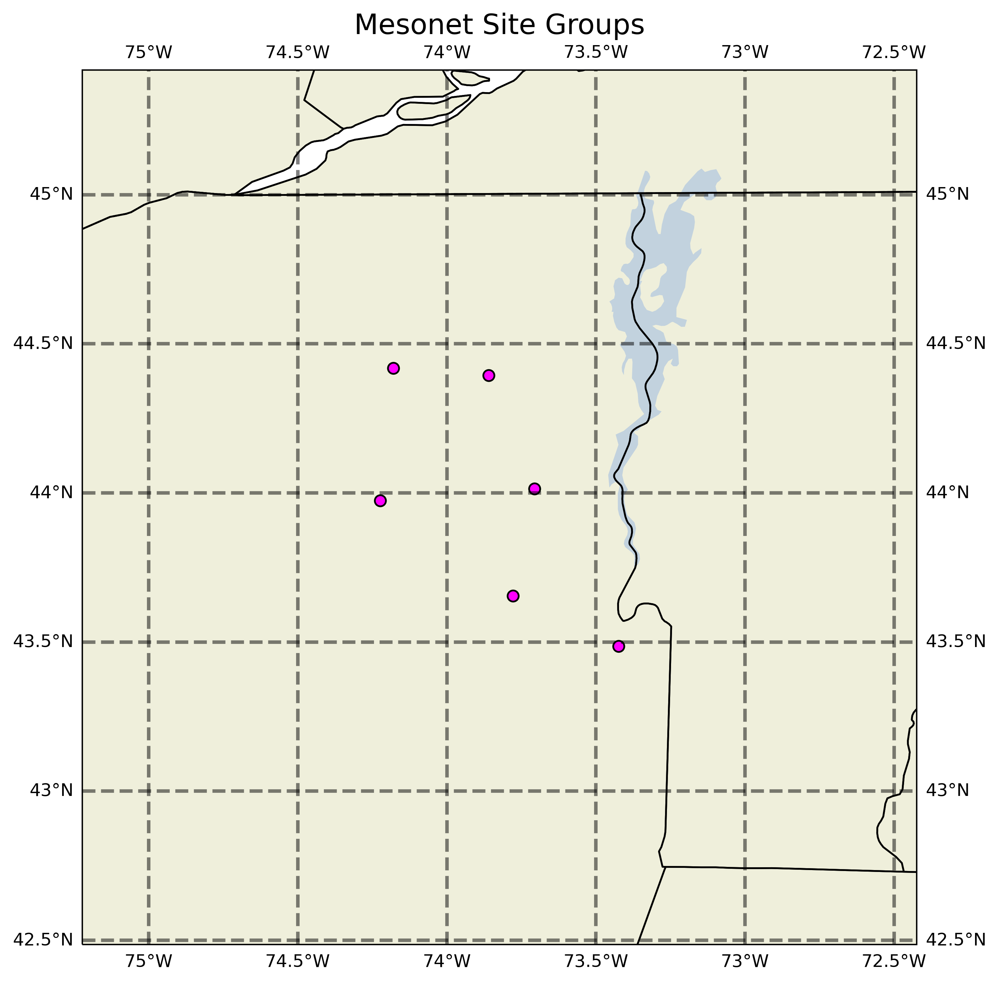

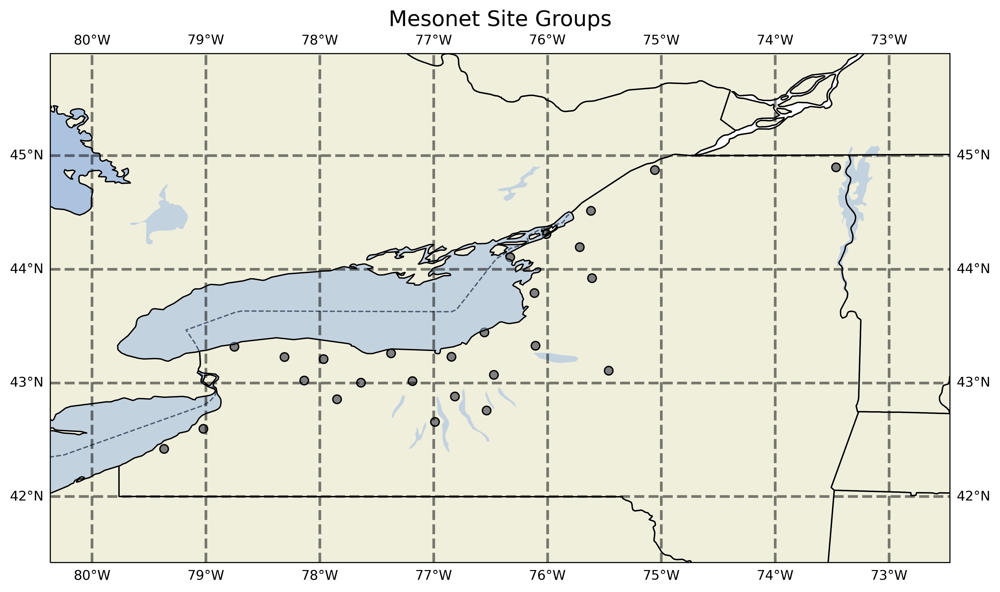

In [80]:
for i in np.arange(0, 12):
    slopes_cat = sortAll.loc[sortAll["Cluster"] == i]
    slopes_cat = pd.merge(slopes_cat, comb_df, on="station")
    slopes_cat = pd.merge(slopes_cat, df_land, on="station")
    plurality_plot_x(slopes_cat)
# slopes_cat.to_csv(f'/home/aevans/landtype/data/clean_cats/ny/df_{i}.csv')

In [ ]:
df_a = pd.read_csv(f"/home/aevans/landtype/data/clean_cats/ny/df_0.csv")
df_a.drop(
    columns=[
        "Unnamed: 0",
        "site_x",
        "11",
        "21_x",
        "22_x",
        "23_x",
        "24_x",
        "31_x",
        "41",
        "42",
        "43",
        "52",
        "71",
        "81",
        "82",
        "90",
        "95",
        "Unnamed: 0_x",
        "site_y",
        "19",
        "21_y",
        "22_y",
        "23_y",
        "24_y",
        "25",
        "26",
        "27",
        "28",
        "33",
        "37",
        "32",
        "34",
        "38",
        "31_y",
        "35",
        "36",
        "Unnamed: 0_y",
        "sum_total",
    ]
)

In [ ]:
plurality_plot_x(df_a)

In [ ]:
# for n,_ in enumerate(df_a['station']):
#     if df_a['lon_x'].iloc[n] < -76:
#         df_a['Cluster'].iloc[n] = 6
#     if df_a['lat_x'].iloc[n] < 43:
#         if df_a['lon_x'].iloc[n] > -75:
#             df_a['Cluster'].iloc[n] = 7
#     if df_a['lat_x'].iloc[n] > 43:
#         df_a['Cluster'].iloc[n] = 8

In [ ]:
df_b = pd.read_csv(f"/home/aevans/landtype/data/clean_cats/ny/df_1.csv")
df_b.drop(
    columns=[
        "Unnamed: 0",
        "site_x",
        "11",
        "21_x",
        "22_x",
        "23_x",
        "24_x",
        "31_x",
        "41",
        "42",
        "43",
        "52",
        "71",
        "81",
        "82",
        "90",
        "95",
        "Unnamed: 0_x",
        "site_y",
        "19",
        "21_y",
        "22_y",
        "23_y",
        "24_y",
        "25",
        "26",
        "27",
        "28",
        "33",
        "37",
        "32",
        "34",
        "38",
        "31_y",
        "35",
        "36",
        "Unnamed: 0_y",
        "sum_total",
    ]
)

In [ ]:
plurality_plot_x(df_b)

In [ ]:
# for n,_ in enumerate(df_b['station']):
#     if df_b['lat_x'].iloc[n] < 43.3:
#         if df_b['lon_x'] > -75:
#             df_b['Cluster'].iloc[n] = 9

In [ ]:
df_c = pd.read_csv(f"/home/aevans/landtype/data/clean_cats/ny/df_2.csv")
df_c.drop(
    columns=[
        "Unnamed: 0",
        "site_x",
        "11",
        "21_x",
        "22_x",
        "23_x",
        "24_x",
        "31_x",
        "41",
        "42",
        "43",
        "52",
        "71",
        "81",
        "82",
        "90",
        "95",
        "Unnamed: 0_x",
        "site_y",
        "19",
        "21_y",
        "22_y",
        "23_y",
        "24_y",
        "25",
        "26",
        "27",
        "28",
        "33",
        "37",
        "32",
        "34",
        "38",
        "31_y",
        "35",
        "36",
        "Unnamed: 0_y",
        "sum_total",
    ]
)

In [ ]:
plurality_plot_x(df_c)

In [ ]:
# for n,_ in enumerate(df_c['station']):
#     if df_c['lat'].iloc[n] < 43:
#         df_c['Cluster'].iloc[n] = 9

In [ ]:
df_d = pd.read_csv(f"/home/aevans/landtype/data/clean_cats/ny/df_3.csv")
df_d.drop(
    columns=[
        "Unnamed: 0",
        "site_x",
        "11",
        "21_x",
        "22_x",
        "23_x",
        "24_x",
        "31_x",
        "41",
        "42",
        "43",
        "52",
        "71",
        "81",
        "82",
        "90",
        "95",
        "Unnamed: 0_x",
        "site_y",
        "19",
        "21_y",
        "22_y",
        "23_y",
        "24_y",
        "25",
        "26",
        "27",
        "28",
        "33",
        "37",
        "32",
        "34",
        "38",
        "31_y",
        "35",
        "36",
        "Unnamed: 0_y",
        "sum_total",
    ]
)

In [ ]:
plurality_plot_x(df_d)

In [ ]:
# for n,_ in enumerate(df_d['station']):
#     if df_d['lat'].iloc[n] < 42.6:
#         if df_d['lon'].iloc[n] > -75:
#             df_d['Cluster'].iloc[n] = 10
#         if df_d['lon'].iloc[n] < -78:
#             df_d['Cluster'].iloc[n] = 11
#     if df_d['lat'].iloc[n] >= 42.6:
#         if df_d['lon'].iloc[n] < -74.1:
#             if df_d['lat'].iloc[n] < 44:
#                 df_d['Cluster'].iloc[n] = 12

In [ ]:
df_e = pd.read_csv(f"/home/aevans/landtype/data/clean_cats/ny/df_4.csv")
df_e.drop(
    columns=[
        "Unnamed: 0",
        "site_x",
        "11",
        "21_x",
        "22_x",
        "23_x",
        "24_x",
        "31_x",
        "41",
        "42",
        "43",
        "52",
        "71",
        "81",
        "82",
        "90",
        "95",
        "Unnamed: 0_x",
        "site_y",
        "19",
        "21_y",
        "22_y",
        "23_y",
        "24_y",
        "25",
        "26",
        "27",
        "28",
        "33",
        "37",
        "32",
        "34",
        "38",
        "31_y",
        "35",
        "36",
        "Unnamed: 0_y",
        "sum_total",
    ]
)

In [ ]:
plurality_plot_x(df_e)

In [ ]:
# for n,_ in enumerate(df_e['station']):
#     if df_e['lon'].iloc[n] < -76:
#         df_e['Cluster'].iloc[n] = 13

In [ ]:
df_f = pd.read_csv(f"/home/aevans/landtype/data/clean_cats/ny/df_5.csv")
df_f.drop(
    columns=[
        "Unnamed: 0",
        "site_x",
        "11",
        "21_x",
        "22_x",
        "23_x",
        "24_x",
        "31_x",
        "41",
        "42",
        "43",
        "52",
        "71",
        "81",
        "82",
        "90",
        "95",
        "Unnamed: 0_x",
        "site_y",
        "19",
        "21_y",
        "22_y",
        "23_y",
        "24_y",
        "25",
        "26",
        "27",
        "28",
        "33",
        "37",
        "32",
        "34",
        "38",
        "31_y",
        "35",
        "36",
        "Unnamed: 0_y",
        "sum_total",
    ]
)

In [ ]:
plurality_plot_x(df_f)

In [ ]:
df_g = pd.read_csv(f"/home/aevans/landtype/data/clean_cats/ny/df_6.csv")
df_g.drop(
    columns=[
        "Unnamed: 0",
        "site_x",
        "11",
        "21_x",
        "22_x",
        "23_x",
        "24_x",
        "31_x",
        "41",
        "42",
        "43",
        "52",
        "71",
        "81",
        "82",
        "90",
        "95",
        "Unnamed: 0_x",
        "site_y",
        "19",
        "21_y",
        "22_y",
        "23_y",
        "24_y",
        "25",
        "26",
        "27",
        "28",
        "33",
        "37",
        "32",
        "34",
        "38",
        "31_y",
        "35",
        "36",
        "Unnamed: 0_y",
        "sum_total",
    ]
)

In [ ]:
plurality_plot_x(df_g)

In [ ]:
df_h = pd.read_csv(f"/home/aevans/landtype/data/clean_cats/ny/df_7.csv")
df_h.drop(
    columns=[
        "Unnamed: 0",
        "site_x",
        "11",
        "21_x",
        "22_x",
        "23_x",
        "24_x",
        "31_x",
        "41",
        "42",
        "43",
        "52",
        "71",
        "81",
        "82",
        "90",
        "95",
        "Unnamed: 0_x",
        "site_y",
        "19",
        "21_y",
        "22_y",
        "23_y",
        "24_y",
        "25",
        "26",
        "27",
        "28",
        "33",
        "37",
        "32",
        "34",
        "38",
        "31_y",
        "35",
        "36",
        "Unnamed: 0_y",
        "sum_total",
    ]
)

In [ ]:
plurality_plot_x(df_h)

In [ ]:
# df_i = pd.read_csv(f'/home/aevans/landtype/data/clean_cats/ny/df_8.csv')
# df_i.drop(columns = ['Unnamed: 0', 'site_x',
#        '11', '21_x', '22_x', '23_x', '24_x', '31_x', '41', '42', '43', '52',
#        '71', '81', '82', '90', '95', 'Unnamed: 0_x','site_y', '19', '21_y', '22_y',
#        '23_y', '24_y', '25', '26', '27', '28', '33', '37', '32', '34', '38',
#        '31_y', '35', '36', 'Unnamed: 0_y', 'sum_total' ])

In [ ]:
# plurality_plot_x(df_i)

In [ ]:
# df_j = pd.read_csv(f'/home/aevans/landtype/data/clean_cats/ny/df_9.csv')
# df_j.drop(columns = ['Unnamed: 0', 'site_x',
#        '11', '21_x', '22_x', '23_x', '24_x', '31_x', '41', '42', '43', '52',
#        '71', '81', '82', '90', '95', 'Unnamed: 0_x','site_y', '19', '21_y', '22_y',
#        '23_y', '24_y', '25', '26', '27', '28', '33', '37', '32', '34', '38',
#        '31_y', '35', '36', 'Unnamed: 0_y', 'sum_total' ])

In [ ]:
# plurality_plot_x(df_j)

In [ ]:
# df_new_cats = pd.concat([df_a, df_b, df_c, df_d, df_e, df_f, df_g, df_h])
# df_new_cats.to_csv('/home/aevans/landtype/df_new_cats.csv')

# Let's explain the clusters

In [ ]:
from kmeans_interp.kmeans_feature_imp import KMeansInterp

kms = KMeansInterp(
    n_clusters=len(sortAll["Cluster"].unique()),
    random_state=1,
    ordered_feature_names=features_all.keys(),
    feature_importance_method="wcss_min",
).fit(features_all)
labels = kms.labels_
sortAll["Cluster"] = labels

In [ ]:
centroids = kms.cluster_centers_
num_clusters = kms.n_clusters
n_features = kms.n_features_in_
centroids_labels = pd.DataFrame(
    {
        "centroid_dim": np.array(
            [centroids[i] for i in range(len(centroids))]
        ).flatten(),
        "cluster_label": np.array(
            [np.repeat(label, n_features) for label in range(num_clusters)]
        ).flatten(),
    }
)

In [ ]:
centroids_labels[centroids_labels["cluster_label"] == 0]["centroid_dim"]

In [ ]:
kms.feature_importances_[1][:-1]

In [ ]:
for cluster_label, feature_weights in kms.feature_importances_.items():
    df_feature_weight = pd.DataFrame(
        feature_weights[:15], columns=["Feature", "Weight"]
    )
    fig, ax = plt.subplots(figsize=(14, 6))
    sns.barplot(x="Feature", y="Weight", data=df_feature_weight)
    plt.xticks(rotation=-45, ha="left")
    ax.tick_params(axis="both", which="major", labelsize=22)
    plt.title(
        f"Highest Weight Features in Cluster {cluster_label}", fontsize="xx-large"
    )
    plt.xlabel("Feature", fontsize=18)
    plt.ylabel("Weight", fontsize=18)

    plt.show()

    print("\n\n")